In [1]:
import pandas as pd
import numpy as np
import seaborn
import matplotlib
import statistics
from sklearn.decomposition import PCA
from sklearn.decomposition import KernelPCA
from sklearn.manifold import TSNE
from sklearn.manifold import MDS
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler
import math
import glob
from itertools import combinations
from matplotlib import pyplot as plt
from Bio import Phylo
import biotite
from pca_plot import *
from vst_function import *
from stattools.resampling import PermutationTest
from scipy import stats
from pyranges import PyRanges
import seaborn as sns

In [2]:
## Read and merge files 
anotation = pd.read_csv('../data/SGDP_anotation.csv', sep=',', encoding='latin-1')

ids_hg19 = pd.DataFrame()
ids_hg19['Sample'] = anotation['3-Illumina_ID']
ids_hg19['Region'] = anotation['10-Region']


In [3]:
# is not working 
chm13 = pd.read_csv('../call_cnvr_chm13/individual_cnv_cnvr.txt', sep='\t')
#chm13

/var/folders/05/4pfxtbrs5459ytz3j1jhcgt00000gn/T/ipykernel_2729/700719383.py:2: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  chm13 = pd.read_csv('../call_cnvr_chm13/individual_cnv_cnvr.txt', sep='\t')


In [4]:
chm13 = chm13.dropna()
chm13

,Chr,Start,End,CNVR_ID,Sample_ID,CNV_Start,CNV_End,CNV_Value,Length
43107,22,15787747.0,51324926.0,CNVR_109275,LP6005442-DNA_A11,20039024,20042704,1,3681
43108,22,15787747.0,51324926.0,CNVR_109275,LP6005442-DNA_A11,20072827,20080819,1,7993
43109,22,15787747.0,51324926.0,CNVR_109275,LP6005442-DNA_A11,20093828,20095291,1,1464
43110,22,15787747.0,51324926.0,CNVR_109275,LP6005442-DNA_A11,20127368,20128368,1,1001
43111,22,15787747.0,51324926.0,CNVR_109275,LP6005442-DNA_A11,20142860,20144633,1,1774
...,...,...,...,...,...,...,...,...,...
35252344,1,248304532.0,248387328.0,CNVR_11357,LP6005441-DNA_B09,248364795,248366351,29,1557
35252345,1,248304532.0,248387328.0,CNVR_11357,LP6005441-DNA_B09,248366351,248367622,30,1272
35252346,1,248304532.0,248387328.0,CNVR_11357,LP6005441-DNA_B09,248367622,248368745,27,1124
35252347,1,248304532.0,248387328.0,CNVR_11357,LP6005441-DNA_B09,248368745,248370339,43,1595


In [5]:

## Keeping only samples that are on old cnvs 
chm13 = chm13.merge(ids_hg19, right_on=['Sample'], left_on=['Sample_ID'])


chm13


,Chr,Start,End,CNVR_ID,Sample_ID,CNV_Start,CNV_End,CNV_Value,Length,Sample,Region
0,22,15787747.0,51324926.0,CNVR_109275,LP6005442-DNA_A11,20039024,20042704,1,3681,LP6005442-DNA_A11,WestEurasia
1,22,15787747.0,51324926.0,CNVR_109275,LP6005442-DNA_A11,20072827,20080819,1,7993,LP6005442-DNA_A11,WestEurasia
2,22,15787747.0,51324926.0,CNVR_109275,LP6005442-DNA_A11,20093828,20095291,1,1464,LP6005442-DNA_A11,WestEurasia
3,22,15787747.0,51324926.0,CNVR_109275,LP6005442-DNA_A11,20127368,20128368,1,1001,LP6005442-DNA_A11,WestEurasia
4,22,15787747.0,51324926.0,CNVR_109275,LP6005442-DNA_A11,20142860,20144633,1,1774,LP6005442-DNA_A11,WestEurasia
...,...,...,...,...,...,...,...,...,...,...,...
25767495,1,248304532.0,248387328.0,CNVR_11357,LP6005441-DNA_B09,248364795,248366351,29,1557,LP6005441-DNA_B09,EastAsia
25767496,1,248304532.0,248387328.0,CNVR_11357,LP6005441-DNA_B09,248366351,248367622,30,1272,LP6005441-DNA_B09,EastAsia
25767497,1,248304532.0,248387328.0,CNVR_11357,LP6005441-DNA_B09,248367622,248368745,27,1124,LP6005441-DNA_B09,EastAsia
25767498,1,248304532.0,248387328.0,CNVR_11357,LP6005441-DNA_B09,248368745,248370339,43,1595,LP6005441-DNA_B09,EastAsia


In [6]:
#REMOVE SAMPLES WITH ABERRATIONS
samples_with_aberrations = ['LP6005441-DNA_B03', ' LP6005443-DNA_G01', 'LP6005441-DNA_G09', 'LP6005441-DNA_D04'] 

chm13 = chm13[~chm13.Sample.isin(samples_with_aberrations)]


chm13#.value_counts(by=["Sample_ID"])
#chm13.columns = ['Chromosome', 'Start', 'End', 'CNVR_ID', 'Sample', 'CNV_start', 'CNV_end', 'Score', 'Length']
chm13

,Chr,Start,End,CNVR_ID,Sample_ID,CNV_Start,CNV_End,CNV_Value,Length,Sample,Region
0,22,15787747.0,51324926.0,CNVR_109275,LP6005442-DNA_A11,20039024,20042704,1,3681,LP6005442-DNA_A11,WestEurasia
1,22,15787747.0,51324926.0,CNVR_109275,LP6005442-DNA_A11,20072827,20080819,1,7993,LP6005442-DNA_A11,WestEurasia
2,22,15787747.0,51324926.0,CNVR_109275,LP6005442-DNA_A11,20093828,20095291,1,1464,LP6005442-DNA_A11,WestEurasia
3,22,15787747.0,51324926.0,CNVR_109275,LP6005442-DNA_A11,20127368,20128368,1,1001,LP6005442-DNA_A11,WestEurasia
4,22,15787747.0,51324926.0,CNVR_109275,LP6005442-DNA_A11,20142860,20144633,1,1774,LP6005442-DNA_A11,WestEurasia
...,...,...,...,...,...,...,...,...,...,...,...
25767495,1,248304532.0,248387328.0,CNVR_11357,LP6005441-DNA_B09,248364795,248366351,29,1557,LP6005441-DNA_B09,EastAsia
25767496,1,248304532.0,248387328.0,CNVR_11357,LP6005441-DNA_B09,248366351,248367622,30,1272,LP6005441-DNA_B09,EastAsia
25767497,1,248304532.0,248387328.0,CNVR_11357,LP6005441-DNA_B09,248367622,248368745,27,1124,LP6005441-DNA_B09,EastAsia
25767498,1,248304532.0,248387328.0,CNVR_11357,LP6005441-DNA_B09,248368745,248370339,43,1595,LP6005441-DNA_B09,EastAsia


In [7]:
## ADDING DUPLICATION/DELETION COLUMN 
#deletions = chm13[chm13['CNV_Value'] < 2 ] 
#deletions['Type'] = 'deletion'
#duplications= chm13[chm13['CNV_Value'] > 2] 
#duplications['Type'] = 'duplication'

#frames = [deletions,duplications]

#chm13 = pd.concat(frames)
#chm13

In [8]:
### Getting gene anotation to filtering 
header_list = ['Chromosome','Start', 'End', 'Name', 'Score', 'Strand', 'End-2', 'End-3', 'TYPE_CODE','BLOCKS', 'Lenght', 'NORELATIVE'] 
gene_anotation = pd.read_table('../data/gene_anotation_chm13', names = header_list)
#gene_anotation = gene_anotation[gene_anotation['TYPE']=='76,85,212'] # only selecting protein-coding genes

feature_table = pd.read_table('../data/GCF_009914755.1_T2T-CHM13v2.0_feature_table.txt')#, index_col='chr

report = pd.read_table('../data/GCF_009914755.1_T2T-CHM13v2.0_assembly_report.txt')

chm13_gene_anotation = feature_table.merge(report, left_on='genomic_accession', right_on='RefSeq-Accn')
chm13_gene_anotation = chm13_gene_anotation[chm13_gene_anotation['class'] == 'protein_coding']
chm13_gene_anotation

/var/folders/05/4pfxtbrs5459ytz3j1jhcgt00000gn/T/ipykernel_2729/1985960472.py:6: DtypeWarning: Columns (5) have mixed types. Specify dtype option on import or set low_memory=False.
  feature_table = pd.read_table('../data/GCF_009914755.1_T2T-CHM13v2.0_feature_table.txt')#, index_col='chr


,# feature,class,assembly,assembly_unit,seq_type,chromosome,genomic_accession,start,end,strand,...,Sequence-Name,Sequence-Role,Assigned-Molecule,Assigned-Molecule-Location/Type,GenBank-Accn,Relationship,RefSeq-Accn,Assembly-Unit,Sequence-Length,UCSC-style-name
0,gene,protein_coding,GCF_009914755.1,Primary Assembly,chromosome,1,NC_060925.1,11134,37628,-,...,1,assembled-molecule,1,Chromosome,CP068277.2,=,NC_060925.1,Primary Assembly,248387328,na
7,gene,protein_coding,GCF_009914755.1,Primary Assembly,chromosome,1,NC_060925.1,111940,112877,-,...,1,assembled-molecule,1,Chromosome,CP068277.2,=,NC_060925.1,Primary Assembly,248387328,na
42,gene,protein_coding,GCF_009914755.1,Primary Assembly,chromosome,1,NC_060925.1,353566,373316,+,...,1,assembled-molecule,1,Chromosome,CP068277.2,=,NC_060925.1,Primary Assembly,248387328,na
49,gene,protein_coding,GCF_009914755.1,Primary Assembly,chromosome,1,NC_060925.1,372945,388041,-,...,1,assembled-molecule,1,Chromosome,CP068277.2,=,NC_060925.1,Primary Assembly,248387328,na
52,gene,protein_coding,GCF_009914755.1,Primary Assembly,chromosome,1,NC_060925.1,389374,394430,+,...,1,assembled-molecule,1,Chromosome,CP068277.2,=,NC_060925.1,Primary Assembly,248387328,na
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
232256,gene,protein_coding,GCF_009914755.1,Primary Assembly,chromosome,Y,NC_060948.1,36480752,36497801,+,...,Y,assembled-molecule,Y,Chromosome,CP086569.2,=,NC_060948.1,Primary Assembly,62460029,na
236280,gene,protein_coding,GCF_009914755.1,Primary Assembly,chromosome,Y,NC_060948.1,62190003,62204700,+,...,Y,assembled-molecule,Y,Chromosome,CP086569.2,=,NC_060948.1,Primary Assembly,62460029,na
236288,gene,protein_coding,GCF_009914755.1,Primary Assembly,chromosome,Y,NC_060948.1,62306325,62368760,+,...,Y,assembled-molecule,Y,Chromosome,CP086569.2,=,NC_060948.1,Primary Assembly,62460029,na
236300,gene,protein_coding,GCF_009914755.1,Primary Assembly,chromosome,Y,NC_060948.1,62422687,62435805,+,...,Y,assembled-molecule,Y,Chromosome,CP086569.2,=,NC_060948.1,Primary Assembly,62460029,na


In [13]:
gene_coordinates = pd.DataFrame()
gene_coordinates['Chromosome'] = chm13_gene_anotation['chromosome'] 
gene_coordinates['Start'] = chm13_gene_anotation['start']
gene_coordinates['End'] = chm13_gene_anotation['end']

In [14]:
#chm13 = pd.read_csv('../data/chm13_gene_regions.csv', index_col=0)
chm13['Lenght'] = chm13['End'] - chm13['Start']
chm13

chm13 = chm13[chm13['Lenght'] < 2000000]
chm13

/var/folders/05/4pfxtbrs5459ytz3j1jhcgt00000gn/T/ipykernel_2729/1536752017.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  chm13['Lenght'] = chm13['End'] - chm13['Start']


,Chr,Start,End,CNVR_ID,Sample_ID,CNV_Start,CNV_End,CNV_Value,Length,Sample,Region,Lenght
1280,18,0.0,333867.0,CNVR_106076,LP6005442-DNA_A11,291416,302798,1,11383,LP6005442-DNA_A11,WestEurasia,333867.0
1281,18,0.0,333867.0,CNVR_106076,LP6005442-DNA_A11,330363,331601,1,1239,LP6005442-DNA_A11,WestEurasia,333867.0
1282,18,2474470.0,2489257.0,CNVR_106169,LP6005442-DNA_A11,2474470,2482601,1,8132,LP6005442-DNA_A11,WestEurasia,14787.0
1283,18,3561572.0,3618743.0,CNVR_106221,LP6005442-DNA_A11,3597925,3601963,1,4039,LP6005442-DNA_A11,WestEurasia,57171.0
1284,18,5313061.0,5362042.0,CNVR_106309,LP6005442-DNA_A11,5320430,5325010,1,4581,LP6005442-DNA_A11,WestEurasia,48981.0
...,...,...,...,...,...,...,...,...,...,...,...,...
25767495,1,248304532.0,248387328.0,CNVR_11357,LP6005441-DNA_B09,248364795,248366351,29,1557,LP6005441-DNA_B09,EastAsia,82796.0
25767496,1,248304532.0,248387328.0,CNVR_11357,LP6005441-DNA_B09,248366351,248367622,30,1272,LP6005441-DNA_B09,EastAsia,82796.0
25767497,1,248304532.0,248387328.0,CNVR_11357,LP6005441-DNA_B09,248367622,248368745,27,1124,LP6005441-DNA_B09,EastAsia,82796.0
25767498,1,248304532.0,248387328.0,CNVR_11357,LP6005441-DNA_B09,248368745,248370339,43,1595,LP6005441-DNA_B09,EastAsia,82796.0


KeyError: 'Type'

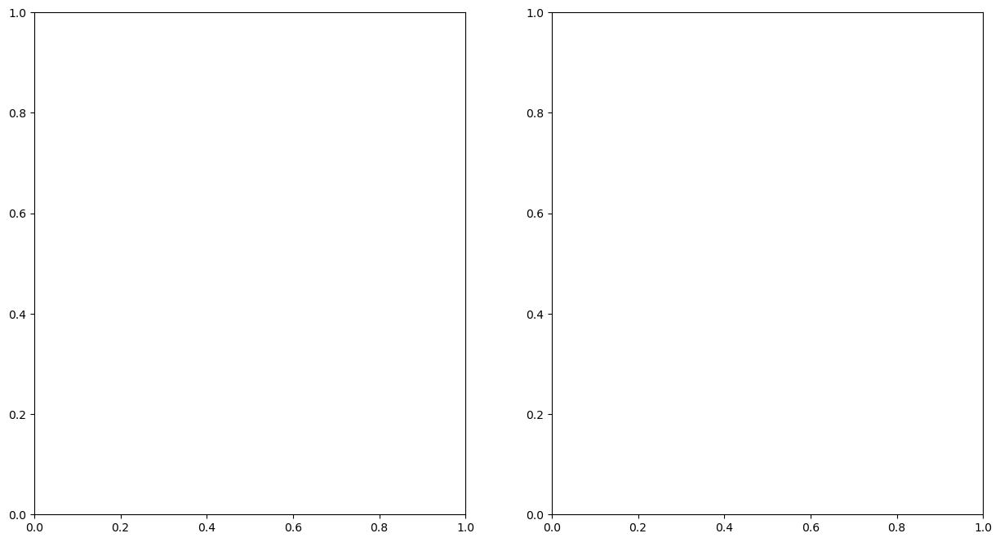

In [15]:
fig, axs = plt.subplots(1, 2, figsize=(15, 8))

df_plot= chm13.groupby(['Type'])['Lenght']

df_plot.plot(kind='hist',stacked=True, bins=100, legend=True, ax=axs[0], log=True, alpha=0.5) # alpha for transparency

plt.xscale('log')
#plt.show()

df_plot = chm13.groupby(['Type'])['Lenght']

df_plot.plot(kind='hist',stacked=True, bins=100, legend=True, ax=axs[1], log=True, alpha=0.5) # alpha for transparency

plt.show()

In [16]:
chm13.columns = ['Chromosome','Start','End','CNVR_ID,','Sample_ID','CNV_Start','CNV_End','CNV_Value','Length','Sample','Region', 'Lenght']

In [17]:
chm13

,Chromosome,Start,End,"CNVR_ID,",Sample_ID,CNV_Start,CNV_End,CNV_Value,Length,Sample,Region,Lenght
1280,18,0.0,333867.0,CNVR_106076,LP6005442-DNA_A11,291416,302798,1,11383,LP6005442-DNA_A11,WestEurasia,333867.0
1281,18,0.0,333867.0,CNVR_106076,LP6005442-DNA_A11,330363,331601,1,1239,LP6005442-DNA_A11,WestEurasia,333867.0
1282,18,2474470.0,2489257.0,CNVR_106169,LP6005442-DNA_A11,2474470,2482601,1,8132,LP6005442-DNA_A11,WestEurasia,14787.0
1283,18,3561572.0,3618743.0,CNVR_106221,LP6005442-DNA_A11,3597925,3601963,1,4039,LP6005442-DNA_A11,WestEurasia,57171.0
1284,18,5313061.0,5362042.0,CNVR_106309,LP6005442-DNA_A11,5320430,5325010,1,4581,LP6005442-DNA_A11,WestEurasia,48981.0
...,...,...,...,...,...,...,...,...,...,...,...,...
25767495,1,248304532.0,248387328.0,CNVR_11357,LP6005441-DNA_B09,248364795,248366351,29,1557,LP6005441-DNA_B09,EastAsia,82796.0
25767496,1,248304532.0,248387328.0,CNVR_11357,LP6005441-DNA_B09,248366351,248367622,30,1272,LP6005441-DNA_B09,EastAsia,82796.0
25767497,1,248304532.0,248387328.0,CNVR_11357,LP6005441-DNA_B09,248367622,248368745,27,1124,LP6005441-DNA_B09,EastAsia,82796.0
25767498,1,248304532.0,248387328.0,CNVR_11357,LP6005441-DNA_B09,248368745,248370339,43,1595,LP6005441-DNA_B09,EastAsia,82796.0


In [18]:
#change to df when using telomeres and centromeres filtration
final_cnv = chm13.pivot_table(index=["Chromosome", "Start", "End"], 
                    columns='Sample', 
                    values='CNV_Value',
                        fill_value=2).reset_index()


final_cnv

Sample,Chromosome,Start,End,LP6005441-DNA_A01,LP6005441-DNA_A03,LP6005441-DNA_A04,LP6005441-DNA_A05,LP6005441-DNA_A06,LP6005441-DNA_A08,LP6005441-DNA_A09,...,LP6005677-DNA_D03,LP6005677-DNA_E01,LP6005677-DNA_F01,LP6005677-DNA_G01,LP6007068-DNA_A01,LP6007069-DNA_A01,SS6004471,SS6004477,SS6004478,SS6004480
0,1,0.0,403567.0,2.0,18.08,2.0000,2.0,2.000000,2.0,2.00,...,2.0,2.000000,2.0,18.446154,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000
1,1,436980.0,452948.0,2.0,6.00,2.0000,2.0,2.000000,2.0,2.00,...,2.0,2.000000,2.0,6.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000
2,1,453948.0,466894.0,2.0,2.00,2.0000,2.0,2.000000,2.0,2.00,...,2.0,2.000000,2.0,3.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000
3,1,472779.0,484339.0,2.0,2.00,2.0000,2.0,2.000000,2.0,2.00,...,2.0,2.000000,2.0,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000
4,1,485339.0,511499.0,2.0,3.00,2.0000,2.0,2.000000,2.0,2.00,...,2.0,2.000000,2.0,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
178386,9,149620306.0,149794372.0,1.0,1.00,1.0000,1.0,2.000000,1.0,1.00,...,1.0,1.000000,1.0,2.000000,2.636364,2.666667,3.166667,2.166667,2.526316,1.000000
178387,9,149796085.0,149801998.0,2.0,2.00,2.0000,2.0,2.000000,2.0,2.00,...,2.0,2.000000,2.0,2.000000,2.000000,2.000000,3.000000,2.000000,2.000000,2.000000
178388,9,149803678.0,149871435.0,1.0,1.00,1.0000,1.0,1.000000,1.0,1.00,...,1.0,1.000000,1.0,1.000000,1.555556,1.555556,2.826087,1.428571,1.700000,0.833333
178389,9,149876993.0,150167512.0,1.0,1.00,3.3000,2.0,3.555556,1.0,3.20,...,2.0,3.333333,1.0,1.000000,2.800000,2.785714,3.096386,3.083333,2.928571,1.000000


<h1> Removing cnvs from exclusion regions 

In [19]:
black_header = ['Chromosome','Start', 'End', 'Type', 'Extra1', 'Extra2']
blacklist = pd.read_table('/Users/luciabazan/Downloads/T2T.excluderanges.bed', names=black_header)
blacklist['Chromosome'] = blacklist['Chromosome'].str.replace('chr', '')
blacklist = blacklist.drop(columns=['Extra1', 'Extra2'])
blacklist_ranges = PyRanges(blacklist)

In [20]:
final_cnv_ranges = PyRanges(final_cnv)
final_cnv = final_cnv_ranges.overlap(blacklist_ranges, invert=True)
final_cnv = final_cnv.as_df()
#final_cnv.to_csv('../data/T2TCHM13_cnvs.csv.zip', compression="zip")
final_cnv

Sample,Chromosome,Start,End,LP6005441-DNA_A01,LP6005441-DNA_A03,LP6005441-DNA_A04,LP6005441-DNA_A05,LP6005441-DNA_A06,LP6005441-DNA_A08,LP6005441-DNA_A09,...,LP6005677-DNA_D03,LP6005677-DNA_E01,LP6005677-DNA_F01,LP6005677-DNA_G01,LP6007068-DNA_A01,LP6007069-DNA_A01,SS6004471,SS6004477,SS6004478,SS6004480
0,1,436980,452948,2.0,6.0,2.0,2.0,2.0,2.0,2.0,...,2.0,2.0,2.0,6.0,2.0,2.0,2.0,2.0,2.0,2.0
1,1,453948,466894,2.0,2.0,2.0,2.0,2.0,2.0,2.0,...,2.0,2.0,2.0,3.0,2.0,2.0,2.0,2.0,2.0,2.0
2,1,472779,484339,2.0,2.0,2.0,2.0,2.0,2.0,2.0,...,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0
3,1,485339,511499,2.0,3.0,2.0,2.0,2.0,2.0,2.0,...,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0
4,1,518975,605035,2.0,3.0,2.0,2.0,2.0,2.0,2.0,...,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
173246,18,76275159,76278412,2.0,2.0,2.0,2.0,2.0,2.0,2.0,...,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0
173247,18,76280220,76283528,2.0,2.0,3.0,2.0,3.0,2.0,2.0,...,2.0,3.0,2.0,3.0,3.0,3.0,3.0,3.0,3.0,2.0
173248,18,76284798,76302290,2.0,2.0,2.0,2.0,2.0,2.0,2.0,...,2.0,2.0,2.0,2.0,2.0,2.0,1.0,2.0,2.0,2.0
173249,18,76304864,76328399,2.0,2.0,1.0,1.0,2.0,2.0,2.0,...,2.0,2.0,2.0,3.0,2.0,2.0,1.0,2.0,2.0,2.0


In [21]:
d = final_cnv.fillna(2)
d.to_csv('../data/t2tchm13_cnvr_cnv_values.csv', index=False) 
# I saved also ('../data/t2tchm13_cnvr_pivot.bed', sep='\t', header=None, index=False)
d

Sample,Chromosome,Start,End,LP6005441-DNA_A01,LP6005441-DNA_A03,LP6005441-DNA_A04,LP6005441-DNA_A05,LP6005441-DNA_A06,LP6005441-DNA_A08,LP6005441-DNA_A09,...,LP6005677-DNA_D03,LP6005677-DNA_E01,LP6005677-DNA_F01,LP6005677-DNA_G01,LP6007068-DNA_A01,LP6007069-DNA_A01,SS6004471,SS6004477,SS6004478,SS6004480
0,1,436980,452948,2.0,6.0,2.0,2.0,2.0,2.0,2.0,...,2.0,2.0,2.0,6.0,2.0,2.0,2.0,2.0,2.0,2.0
1,1,453948,466894,2.0,2.0,2.0,2.0,2.0,2.0,2.0,...,2.0,2.0,2.0,3.0,2.0,2.0,2.0,2.0,2.0,2.0
2,1,472779,484339,2.0,2.0,2.0,2.0,2.0,2.0,2.0,...,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0
3,1,485339,511499,2.0,3.0,2.0,2.0,2.0,2.0,2.0,...,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0
4,1,518975,605035,2.0,3.0,2.0,2.0,2.0,2.0,2.0,...,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
173246,18,76275159,76278412,2.0,2.0,2.0,2.0,2.0,2.0,2.0,...,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0
173247,18,76280220,76283528,2.0,2.0,3.0,2.0,3.0,2.0,2.0,...,2.0,3.0,2.0,3.0,3.0,3.0,3.0,3.0,3.0,2.0
173248,18,76284798,76302290,2.0,2.0,2.0,2.0,2.0,2.0,2.0,...,2.0,2.0,2.0,2.0,2.0,2.0,1.0,2.0,2.0,2.0
173249,18,76304864,76328399,2.0,2.0,1.0,1.0,2.0,2.0,2.0,...,2.0,2.0,2.0,3.0,2.0,2.0,1.0,2.0,2.0,2.0


Sample,Chromosome,Start,End,LP6005441-DNA_A01,LP6005441-DNA_A03,LP6005441-DNA_A04,LP6005441-DNA_A05,LP6005441-DNA_A06,LP6005441-DNA_A08,LP6005441-DNA_A09,...,LP6005677-DNA_D03,LP6005677-DNA_E01,LP6005677-DNA_F01,LP6005677-DNA_G01,LP6007068-DNA_A01,LP6007069-DNA_A01,SS6004471,SS6004477,SS6004478,SS6004480
0,chr1,436980,452948,2.0,6.0,2.0,2.0,2.0,2.0,2.0,...,2.0,2.0,2.0,6.0,2.0,2.0,2.0,2.0,2.0,2.0
1,chr1,453948,466894,2.0,2.0,2.0,2.0,2.0,2.0,2.0,...,2.0,2.0,2.0,3.0,2.0,2.0,2.0,2.0,2.0,2.0
2,chr1,472779,484339,2.0,2.0,2.0,2.0,2.0,2.0,2.0,...,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0
3,chr1,485339,511499,2.0,3.0,2.0,2.0,2.0,2.0,2.0,...,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0
4,chr1,518975,605035,2.0,3.0,2.0,2.0,2.0,2.0,2.0,...,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
173246,chr18,76275159,76278412,2.0,2.0,2.0,2.0,2.0,2.0,2.0,...,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0
173247,chr18,76280220,76283528,2.0,2.0,3.0,2.0,3.0,2.0,2.0,...,2.0,3.0,2.0,3.0,3.0,3.0,3.0,3.0,3.0,2.0
173248,chr18,76284798,76302290,2.0,2.0,2.0,2.0,2.0,2.0,2.0,...,2.0,2.0,2.0,2.0,2.0,2.0,1.0,2.0,2.0,2.0
173249,chr18,76304864,76328399,2.0,2.0,1.0,1.0,2.0,2.0,2.0,...,2.0,2.0,2.0,3.0,2.0,2.0,1.0,2.0,2.0,2.0


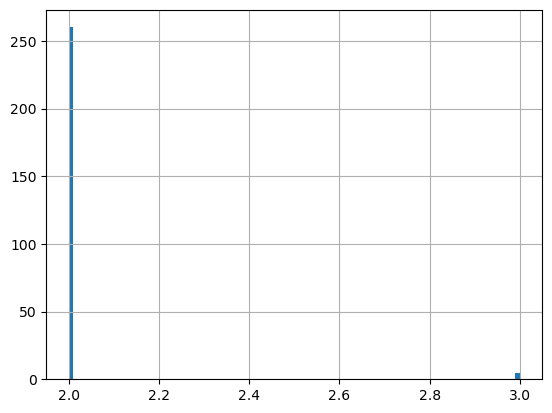

In [22]:
d.iloc[81275,4:280].hist(bins=100)
d['Chromosome'] = 'chr' + d['Chromosome'].astype(str)
d

In [23]:
## Saving CNVs coordinates as bed file to liftover
d.iloc[:,0:4].to_csv('cnvrs_coordinates_chm13t2t.bed', header=False, index=False,sep='\t')

In [24]:
columns = d.columns
np.savetxt("../data/t2tchm13_cnvrs_pivot_names.bed", columns,
           delimiter ="/t", 
           fmt ='% s')

<h1> PCA 

In [25]:
counts = final_cnv.iloc[:,4:287].T
features = ids_hg19.set_index('Sample').merge(counts, left_index=True, right_index=True)
features = features.loc[:,['Region']]
features = features.sort_index()
features 

,Region
Sample,
LP6005441-DNA_A03,Oceania
LP6005441-DNA_A04,America
LP6005441-DNA_A05,WestEurasia
LP6005441-DNA_A06,WestEurasia
LP6005441-DNA_A08,Africa
...,...
LP6007069-DNA_A01,WestEurasia
SS6004471,Africa
SS6004477,Oceania


<h1> VST

In [26]:
#coordinates = input_vst.iloc[:,0:2]
cnvs = final_cnv.iloc[:,4:287]
cnvs = cnvs.T
cnvs = cnvs.fillna(2)
cnvs

,0,1,2,3,4,5,6,7,8,9,...,173241,173242,173243,173244,173245,173246,173247,173248,173249,173250
Sample,,,,,,,,,,,,,,,,,,,,,
LP6005441-DNA_A03,6.0,2.0,2.0,3.0,3.0,2.0,2.0,2.0,2.0,2.0,...,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0
LP6005441-DNA_A04,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,...,2.0,2.0,2.0,2.0,2.0,2.0,3.0,2.0,1.0,2.0
LP6005441-DNA_A05,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,...,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,1.0,2.0
LP6005441-DNA_A06,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,...,2.0,2.0,2.0,2.0,2.0,2.0,3.0,2.0,2.0,2.0
LP6005441-DNA_A08,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,...,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
LP6007069-DNA_A01,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,...,2.0,2.0,2.0,2.0,2.0,2.0,3.0,2.0,2.0,2.0
SS6004471,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,...,2.0,2.0,1.0,2.0,2.0,2.0,3.0,1.0,1.0,1.0
SS6004477,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,...,2.0,2.0,2.0,2.0,2.0,2.0,3.0,2.0,2.0,2.0


In [27]:
dt = features.merge(cnvs, left_index=True, right_index=True)
dt

,Region,0,1,2,3,4,5,6,7,8,...,173241,173242,173243,173244,173245,173246,173247,173248,173249,173250
Sample,,,,,,,,,,,,,,,,,,,,,
LP6005441-DNA_A03,Oceania,6.0,2.0,2.0,3.0,3.0,2.0,2.0,2.0,2.0,...,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0
LP6005441-DNA_A04,America,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,...,2.0,2.0,2.0,2.0,2.0,2.0,3.0,2.0,1.0,2.0
LP6005441-DNA_A05,WestEurasia,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,...,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,1.0,2.0
LP6005441-DNA_A06,WestEurasia,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,...,2.0,2.0,2.0,2.0,2.0,2.0,3.0,2.0,2.0,2.0
LP6005441-DNA_A08,Africa,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,...,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
LP6007069-DNA_A01,WestEurasia,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,...,2.0,2.0,2.0,2.0,2.0,2.0,3.0,2.0,2.0,2.0
SS6004471,Africa,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,...,2.0,2.0,1.0,2.0,2.0,2.0,3.0,1.0,1.0,1.0
SS6004477,Oceania,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,...,2.0,2.0,2.0,2.0,2.0,2.0,3.0,2.0,2.0,2.0


<h1> New Vst

In [28]:
####### Groupby regions #######
dt_group = dt.groupby('Region')

dt_groupped = []
regions = features['Region'].unique()
regions.sort()
for i in regions:
    dt_groupped.append(dt_group.get_group(str(i)))
    

dt_groupped

[                   Region    0    1    2    3    4    5    6    7    8  ...  \
 Sample                                                                  ...   
 LP6005441-DNA_A08  Africa  2.0  2.0  2.0  2.0  2.0  2.0  2.0  2.0  2.0  ...   
 LP6005441-DNA_A11  Africa  2.0  2.0  2.0  2.0  2.0  2.0  2.0  2.0  2.0  ...   
 LP6005441-DNA_B02  Africa  2.0  2.0  2.0  2.0  2.0  2.0  2.0  2.0  2.0  ...   
 LP6005441-DNA_B08  Africa  2.0  2.0  2.0  2.0  2.0  2.0  2.0  2.0  2.0  ...   
 LP6005441-DNA_B11  Africa  2.0  2.0  2.0  2.0  2.0  2.0  2.0  2.0  2.0  ...   
 LP6005441-DNA_E07  Africa  2.0  2.0  2.0  2.0  2.0  2.0  2.0  2.0  2.0  ...   
 LP6005441-DNA_F01  Africa  2.0  2.0  2.0  2.0  2.0  2.0  2.0  2.0  2.0  ...   
 LP6005441-DNA_F07  Africa  2.0  2.0  2.0  2.0  2.0  2.0  2.0  2.0  2.0  ...   
 LP6005441-DNA_G02  Africa  2.0  2.0  2.0  2.0  2.0  2.0  2.0  2.0  2.0  ...   
 LP6005441-DNA_G08  Africa  2.0  2.0  2.0  2.0  2.0  2.0  2.0  2.0  2.0  ...   
 LP6005441-DNA_H02  Africa  6.0  2.0  2.

In [29]:
#### Names to pair-population
regions = dt['Region'].unique()
regions.sort()
combination_names = []
for i in list(combinations(regions,2)):
    combination_names.append(i[0]+str('-')+i[1])

for j in dt_groupped:
    del j['Region']


In [30]:
## Function for Vst 
def vst_function(
    x=None, 
    y=None):

    vx = np.var(x, axis=0)
    vy = np.var(y, axis=0)

    nx = len(x)
    ny = len(y)

## Vt 
    a = np.concatenate((x,y))
    vt = np.ndarray.var(a,axis=0)

### Vs = (V1*n1+V2*n2)/(n1+n2) 

    v1 = vx*nx
    v2 = vy*ny
    ns = nx+ny
    vs = (v1+v2)/ ns
    ########## Vst #################
    #####(VT−VS)/VT
    
    vst = (vt-vs)/vt
    
    return(vst) 


combination_regions = list(combinations([0,1,2,3,4,5,6],2))

vst_list = []
for region in combination_regions:
    vx = np.var(dt_groupped[region[0]])
    vy = np.var(dt_groupped[region[1]])

    nx = len(dt_groupped[region[0]])
    ny = len(dt_groupped[region[1]])

## Vt 
    a = np.concatenate((dt_groupped[region[0]], dt_groupped[region[1]]))
    vt = np.ndarray.var(a,axis=0)

### Vs = (V1*n1+V2*n2)/(n1+n2) 

    v1 = vx*nx
    v2 = vy*ny
    ns = nx+ny
    vs = (v1+v2)/ ns
    ########## Vst #################
    #####(VT−VS)/VT
    
    vst = (vt-vs)/vt
    
    vst_list.append(vst)

In [31]:
## VST for pair-population
vst_dt = []

combination_regions = list(combinations([0,1,2,3,4,5,6],2))
for region in combination_regions:
        statistic = vst_function((dt_groupped[region[0]]), (dt_groupped[region[1]]))
        vst_dt.append(statistic)

vst_dt = pd.DataFrame(vst_dt).set_axis(combination_names)
vst_dt

,0,1,2,3,4,5,6,7,8,9,...,173241,173242,173243,173244,173245,173246,173247,173248,173249,173250
Africa-America,0.012864,0.008130,NaN,NaN,NaN,0.025231,NaN,0.008130,NaN,0.008130,...,NaN,NaN,0.034232,NaN,0.034232,NaN,0.006509,0.000007,0.000635,0.039518
Africa-CentralAsiaSiberia,0.001431,0.009829,NaN,NaN,NaN,0.000003,NaN,0.009829,NaN,0.014013,...,NaN,NaN,0.041159,NaN,0.005902,0.022664,0.019083,0.000783,0.005195,0.034452
Africa-EastAsia,0.002910,0.012912,NaN,NaN,0.010719,0.000163,NaN,0.012912,NaN,0.012912,...,NaN,NaN,0.062879,NaN,0.007522,NaN,0.002739,0.026132,0.004447,0.010071
Africa-Oceania,0.002894,0.008904,NaN,0.028295,0.028295,0.027589,NaN,0.008904,NaN,0.008904,...,NaN,NaN,0.037398,NaN,0.012271,NaN,0.020964,0.018096,0.003390,0.013860
Africa-SouthAsia,0.005073,0.011882,NaN,NaN,NaN,0.011401,NaN,0.011882,NaN,0.011882,...,NaN,NaN,0.049431,NaN,0.000163,NaN,0.012505,0.024073,0.003259,0.031444
Africa-WestEurasia,0.000141,0.015601,0.005202,NaN,0.005202,0.015492,0.005202,0.015601,0.005202,0.019237,...,0.005202,0.010088,0.056046,0.005202,0.027040,0.005202,0.013500,0.020580,0.000921,0.052456
America-CentralAsiaSiberia,0.024771,NaN,NaN,NaN,NaN,0.032922,NaN,NaN,NaN,0.032922,...,NaN,NaN,NaN,NaN,0.068906,0.016103,0.003030,0.001008,0.013995,0.005291
America-EastAsia,0.004537,NaN,NaN,NaN,0.006944,0.021505,NaN,NaN,NaN,NaN,...,NaN,NaN,0.006944,NaN,0.053640,NaN,0.000949,0.035156,0.009899,0.025840
America-Oceania,0.005236,NaN,NaN,0.020704,0.020704,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,0.089186,NaN,0.004253,0.027381,0.011320,0.020704
America-SouthAsia,0.002948,NaN,NaN,NaN,NaN,0.009234,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,0.038986,NaN,0.000627,0.033333,0.001271,0.009234


In [32]:
filtering_vst = pd.DataFrame(vst_dt)>=0.2
filtering_vst = filtering_vst.loc[:, filtering_vst.any()]
#filtering_vst = filtering_vst.set_axis(combination_names)
filtering_vst



,2875,2989,3197,3276,3285,3303,3354,3358,3394,3545,...,172832,172833,172839,172848,172851,172853,172885,172889,173001,173201
Africa-America,False,False,False,False,True,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
Africa-CentralAsiaSiberia,False,False,False,False,True,False,False,False,False,False,...,False,False,False,True,False,False,False,False,False,False
Africa-EastAsia,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
Africa-Oceania,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
Africa-SouthAsia,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
Africa-WestEurasia,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
America-CentralAsiaSiberia,False,True,True,True,False,True,True,False,True,False,...,False,False,False,False,True,False,True,False,True,False
America-EastAsia,False,False,False,False,False,False,False,False,False,True,...,False,False,False,False,False,False,False,False,False,False
America-Oceania,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,True,False,False,False,False
America-SouthAsia,True,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False


In [33]:
## Coordinates anotation 
vst_dt = vst_dt.T
vst_dt.insert (0, 'Chromosome', final_cnv['Chromosome'])
vst_dt.insert (1, 'Start', final_cnv['Start'])
vst_dt.insert (2, 'End', final_cnv['End'])
#vst_dt.insert (3, 'Type', final_cnv['Type'])
vst_dt = vst_dt.round(5)
vst_dt = vst_dt.replace(np.NaN, 0)
vst_dt

,Chromosome,Start,End,Africa-America,Africa-CentralAsiaSiberia,Africa-EastAsia,Africa-Oceania,Africa-SouthAsia,Africa-WestEurasia,America-CentralAsiaSiberia,...,CentralAsiaSiberia-EastAsia,CentralAsiaSiberia-Oceania,CentralAsiaSiberia-SouthAsia,CentralAsiaSiberia-WestEurasia,EastAsia-Oceania,EastAsia-SouthAsia,EastAsia-WestEurasia,Oceania-SouthAsia,Oceania-WestEurasia,SouthAsia-WestEurasia
0,1,436980,452948,0.01286,0.00143,0.00291,0.00289,0.00507,0.00014,0.02477,...,0.00833,0.00881,0.01210,0.00053,0.00001,0.00032,0.00392,0.00020,0.00319,0.00583
1,1,453948,466894,0.00813,0.00983,0.01291,0.00890,0.01188,0.01560,0.00000,...,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000
2,1,472779,484339,0.00000,0.00000,0.00000,0.00000,0.00000,0.00520,0.00000,...,0.00000,0.00000,0.00000,0.00392,0.00000,0.00000,0.00551,0.00000,0.00348,0.00496
3,1,485339,511499,0.00000,0.00000,0.00000,0.02830,0.00000,0.00000,0.00000,...,0.00000,0.02396,0.00000,0.00000,0.02920,0.00000,0.00000,0.02754,0.03319,0.00000
4,1,518975,605035,0.00000,0.00000,0.01072,0.02830,0.00000,0.00520,0.00000,...,0.00845,0.02396,0.00000,0.00392,0.00354,0.01030,0.01815,0.02754,0.02878,0.00496
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
173246,18,76275159,76278412,0.00000,0.02266,0.00000,0.00000,0.00000,0.00520,0.01610,...,0.02347,0.01738,0.02199,0.02556,0.00000,0.00000,0.00551,0.00000,0.00348,0.00496
173247,18,76280220,76283528,0.00651,0.01908,0.00274,0.02096,0.01250,0.01350,0.00303,...,0.00741,0.00009,0.00084,0.00033,0.00870,0.00353,0.00446,0.00143,0.00067,0.00007
173248,18,76284798,76302290,0.00001,0.00078,0.02613,0.01810,0.02407,0.02058,0.00101,...,0.02347,0.01738,0.02199,0.01278,0.00000,0.00000,0.00183,0.00000,0.00115,0.00164
173249,18,76304864,76328399,0.00064,0.00520,0.00445,0.00339,0.00326,0.00092,0.01399,...,0.00009,0.00021,0.02539,0.00131,0.00002,0.02109,0.00101,0.02085,0.00056,0.00737


In [34]:
vst_dt['Chromosome'] = 'chr' + vst_dt['Chromosome'].astype(str)
vst_dt

,Chromosome,Start,End,Africa-America,Africa-CentralAsiaSiberia,Africa-EastAsia,Africa-Oceania,Africa-SouthAsia,Africa-WestEurasia,America-CentralAsiaSiberia,...,CentralAsiaSiberia-EastAsia,CentralAsiaSiberia-Oceania,CentralAsiaSiberia-SouthAsia,CentralAsiaSiberia-WestEurasia,EastAsia-Oceania,EastAsia-SouthAsia,EastAsia-WestEurasia,Oceania-SouthAsia,Oceania-WestEurasia,SouthAsia-WestEurasia
0,chr1,436980,452948,0.01286,0.00143,0.00291,0.00289,0.00507,0.00014,0.02477,...,0.00833,0.00881,0.01210,0.00053,0.00001,0.00032,0.00392,0.00020,0.00319,0.00583
1,chr1,453948,466894,0.00813,0.00983,0.01291,0.00890,0.01188,0.01560,0.00000,...,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000
2,chr1,472779,484339,0.00000,0.00000,0.00000,0.00000,0.00000,0.00520,0.00000,...,0.00000,0.00000,0.00000,0.00392,0.00000,0.00000,0.00551,0.00000,0.00348,0.00496
3,chr1,485339,511499,0.00000,0.00000,0.00000,0.02830,0.00000,0.00000,0.00000,...,0.00000,0.02396,0.00000,0.00000,0.02920,0.00000,0.00000,0.02754,0.03319,0.00000
4,chr1,518975,605035,0.00000,0.00000,0.01072,0.02830,0.00000,0.00520,0.00000,...,0.00845,0.02396,0.00000,0.00392,0.00354,0.01030,0.01815,0.02754,0.02878,0.00496
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
173246,chr18,76275159,76278412,0.00000,0.02266,0.00000,0.00000,0.00000,0.00520,0.01610,...,0.02347,0.01738,0.02199,0.02556,0.00000,0.00000,0.00551,0.00000,0.00348,0.00496
173247,chr18,76280220,76283528,0.00651,0.01908,0.00274,0.02096,0.01250,0.01350,0.00303,...,0.00741,0.00009,0.00084,0.00033,0.00870,0.00353,0.00446,0.00143,0.00067,0.00007
173248,chr18,76284798,76302290,0.00001,0.00078,0.02613,0.01810,0.02407,0.02058,0.00101,...,0.02347,0.01738,0.02199,0.01278,0.00000,0.00000,0.00183,0.00000,0.00115,0.00164
173249,chr18,76304864,76328399,0.00064,0.00520,0.00445,0.00339,0.00326,0.00092,0.01399,...,0.00009,0.00021,0.02539,0.00131,0.00002,0.02109,0.00101,0.02085,0.00056,0.00737


In [52]:
#vst_dt = vst_dt.drop([46387])
vst_dt.sort_values(by=['Oceania-WestEurasia'], ascending=False).head(50)

,Chromosome,Start,End,Africa-America,Africa-CentralAsiaSiberia,Africa-EastAsia,Africa-Oceania,Africa-SouthAsia,Africa-WestEurasia,America-CentralAsiaSiberia,...,CentralAsiaSiberia-Oceania,CentralAsiaSiberia-SouthAsia,CentralAsiaSiberia-WestEurasia,EastAsia-Oceania,EastAsia-SouthAsia,EastAsia-WestEurasia,Oceania-SouthAsia,Oceania-WestEurasia,SouthAsia-WestEurasia,i
108649,chr8,144763086,144782295,0.00597,0.08607,0.11986,0.29754,0.00822,0.01630,0.04321,...,0.07582,0.04211,0.15483,0.03913,0.07079,0.20527,0.21660,0.38324,0.04425,108649.0
120157,chr10,83240324,83243664,0.13277,0.40516,0.16208,0.00531,0.26846,0.46327,0.10610,...,0.36790,0.04819,0.00000,0.09985,0.02080,0.13354,0.20037,0.37331,0.05329,120157.0
160222,chr16,64694368,64715794,0.07163,0.08546,0.00002,0.16450,0.01548,0.06398,0.00000,...,0.39049,0.03040,0.01201,0.16052,0.01642,0.06598,0.24364,0.37248,0.01149,160222.0
164598,chr17,10892408,10905466,0.00110,0.05579,0.04690,0.09625,0.00056,0.18659,0.03886,...,0.00812,0.04673,0.32743,0.00642,0.03875,0.25943,0.08559,0.36245,0.20581,164598.0
138147,chr13,22203778,22229397,0.02996,0.07856,0.00294,0.14258,0.01981,0.11807,0.01399,...,0.39648,0.02900,0.00537,0.12052,0.04103,0.16052,0.27744,0.34588,0.05528,138147.0
43550,chr3,143570876,143587732,0.15977,0.01060,0.19671,0.47335,0.01422,0.01066,0.10066,...,0.41144,0.00013,0.00001,0.14718,0.11689,0.12643,0.39283,0.34468,0.00023,43550.0
13147,chr1,233563506,233570810,0.32404,0.52045,0.86890,0.66712,0.24839,0.04955,0.01645,...,0.04948,0.06593,0.22898,0.00964,0.32794,0.53320,0.17582,0.34372,0.07442,13147.0
58329,chr4,181936688,181943703,0.08443,0.00173,0.03317,0.18388,0.01324,0.03647,0.08818,...,0.22571,0.00536,0.02030,0.35273,0.00468,0.00006,0.28887,0.34327,0.00555,58329.0
55858,chr4,109306446,109349208,0.14723,0.03220,0.06116,0.19548,0.02269,0.01072,0.06137,...,0.09689,0.00056,0.10268,0.03243,0.01237,0.13921,0.09617,0.34304,0.07760,55858.0
7286,chr1,88471728,88473184,0.06032,0.06059,0.00049,0.31617,0.01291,0.00156,0.00101,...,0.39340,0.08180,0.02296,0.30477,0.00898,0.00347,0.21930,0.31124,0.01922,7286.0


In [53]:
#vst_dt = vst_dt.drop([46387])
vst_dt.sort_values(by=['Africa-America'], ascending=False).head(50)

,Chromosome,Start,End,Africa-America,Africa-CentralAsiaSiberia,Africa-EastAsia,Africa-Oceania,Africa-SouthAsia,Africa-WestEurasia,America-CentralAsiaSiberia,...,CentralAsiaSiberia-Oceania,CentralAsiaSiberia-SouthAsia,CentralAsiaSiberia-WestEurasia,EastAsia-Oceania,EastAsia-SouthAsia,EastAsia-WestEurasia,Oceania-SouthAsia,Oceania-WestEurasia,SouthAsia-WestEurasia,i
12071,chr1,214544727,214627883,0.60643,0.26029,0.13376,0.14827,0.02245,0.03039,0.19138,...,0.02545,0.13651,0.05978,0.00405,0.06621,0.03049,0.04846,0.01069,0.00542,12071.0
8308,chr1,112161740,112202356,0.53508,0.27652,0.23050,0.34456,0.46314,0.16745,0.13210,...,0.00842,0.04897,0.01177,0.02299,0.08435,0.00305,0.01605,0.03444,0.10640,8308.0
140373,chr13,77648121,77677339,0.51899,0.01499,0.01202,0.01410,0.03477,0.00586,0.29190,...,0.04026,0.00035,0.00170,0.03489,0.00170,0.00078,0.08242,0.02245,0.00496,140373.0
95540,chr7,111096865,111143334,0.51278,0.10459,0.09666,0.00116,0.01695,0.12452,0.26833,...,0.08073,0.03514,0.00338,0.06577,0.03276,0.00452,0.00809,0.08119,0.05475,95540.0
167473,chr17,73756879,73779557,0.51020,0.28458,0.12637,0.37756,0.40335,0.37150,0.06075,...,0.00888,0.00615,0.02379,0.09789,0.10600,0.14369,0.00060,0.00470,0.01053,167473.0
81966,chr6,65090441,65113686,0.50204,0.15777,0.16225,0.00000,0.10490,0.15749,0.07856,...,0.12504,0.01465,0.00145,0.12081,0.01487,0.00264,0.07846,0.11107,0.02640,81966.0
117666,chr10,17253060,17293867,0.46762,0.04992,0.00099,0.00592,0.02572,0.03899,0.26532,...,0.06385,0.10266,0.10177,0.00793,0.02721,0.04322,0.00457,0.01126,0.00329,117666.0
10977,chr1,198398895,198448244,0.46575,0.40866,0.54050,0.46887,0.33835,0.18956,0.04334,...,0.00572,0.02796,0.03079,0.05865,0.15585,0.13089,0.06603,0.04244,0.00630,10977.0
94850,chr7,92635538,92675018,0.46161,0.30908,0.16532,0.00294,0.03694,0.00310,0.02210,...,0.21676,0.17719,0.26629,0.09975,0.07178,0.14772,0.01256,0.00000,0.01604,94850.0
165003,chr17,18949712,18961908,0.43540,0.21134,0.22122,0.10094,0.25386,0.02448,0.05177,...,0.02768,0.00593,0.08840,0.04112,0.00064,0.12740,0.05388,0.01701,0.14392,165003.0


In [36]:
vst_dt.to_csv('../data/vst_cnvr_results_t2tchm13.csv', index=False)

In [37]:
vst_dt_filtered = vst_dt.iloc[filtering_vst.T.index]
vst_dt_filtered#.sort_values(by=['WestEurasia-Oceania'], ascending=False).head(50)
vst_dt_filtered.to_csv('vst_cnvr_candidates_chm13t2t.csv', index=False)
vst_dt_filtered

,Chromosome,Start,End,Africa-America,Africa-CentralAsiaSiberia,Africa-EastAsia,Africa-Oceania,Africa-SouthAsia,Africa-WestEurasia,America-CentralAsiaSiberia,...,CentralAsiaSiberia-EastAsia,CentralAsiaSiberia-Oceania,CentralAsiaSiberia-SouthAsia,CentralAsiaSiberia-WestEurasia,EastAsia-Oceania,EastAsia-SouthAsia,EastAsia-WestEurasia,Oceania-SouthAsia,Oceania-WestEurasia,SouthAsia-WestEurasia
2875,chr1,4119209,4123876,0.00358,0.07555,0.00279,0.01831,0.13432,0.06417,0.13336,...,0.05204,0.02944,0.02199,0.00108,0.00745,0.10270,0.04197,0.08546,0.01125,0.01342
2989,chr1,5373793,5375048,0.11646,0.15901,0.04903,0.00529,0.01122,0.00745,0.46901,...,0.31681,0.26430,0.09410,0.08024,0.02359,0.10044,0.08628,0.03249,0.02018,0.00023
3197,chr1,7884464,7898408,0.00137,0.19214,0.00663,0.00171,0.07493,0.01380,0.20801,...,0.11424,0.12990,0.04874,0.08173,0.00089,0.03247,0.00126,0.03888,0.00345,0.01988
3276,chr1,9027078,9126952,0.11322,0.15759,0.04063,0.02407,0.00195,0.00094,0.36415,...,0.24823,0.24866,0.14259,0.09496,0.00176,0.01992,0.04695,0.00919,0.02439,0.00466
3285,chr1,9285874,9351410,0.23644,0.27229,0.04292,0.00510,0.09830,0.01985,0.00460,...,0.10146,0.18713,0.05719,0.14793,0.01534,0.00937,0.00508,0.04876,0.00374,0.02938
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
172853,chr18,66465013,66585794,0.10172,0.14927,0.04288,0.01066,0.08840,0.11119,0.01452,...,0.05703,0.22360,0.02166,0.02464,0.09175,0.01185,0.01586,0.15292,0.17402,0.00001
172885,chr18,67974136,67991293,0.04005,0.07557,0.01498,0.00284,0.00030,0.04565,0.23625,...,0.03529,0.07493,0.07226,0.00018,0.00418,0.01115,0.01706,0.00141,0.02301,0.03944
172889,chr18,68041106,68075150,0.01920,0.04145,0.07662,0.00000,0.04574,0.02373,0.00489,...,0.19574,0.04368,0.00000,0.00099,0.06939,0.21308,0.15132,0.04452,0.01880,0.00124
173001,chr18,71524229,71548201,0.01152,0.10119,0.00651,0.00115,0.00353,0.00841,0.20801,...,0.06210,0.10336,0.06024,0.04435,0.00186,0.00026,0.00017,0.00062,0.00262,0.00078


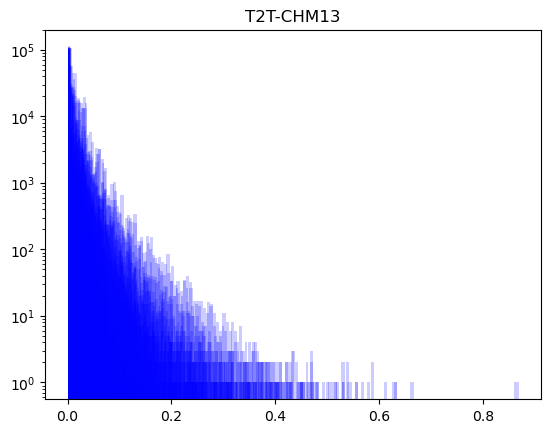

In [38]:
#sns.set_palette("bright")
for i in vst_dt.iloc[:,4:25].columns:
    plt.hist(vst_dt[i], bins=100, alpha=0.2, log=True,color="blue")
    plt.title('T2T-CHM13')

/Users/luciabazan/anaconda3/lib/python3.11/site-packages/pandas/plotting/_matplotlib/tools.py:227: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = plt.figure(**fig_kw)


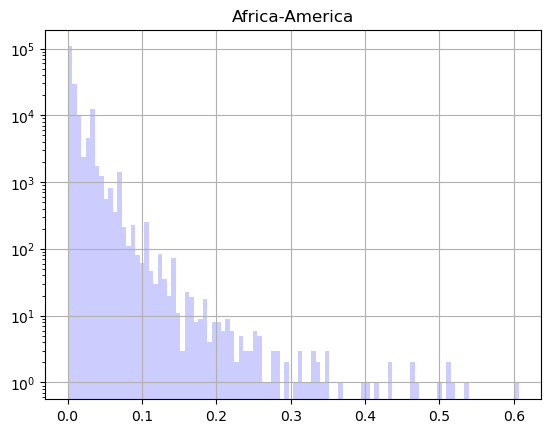

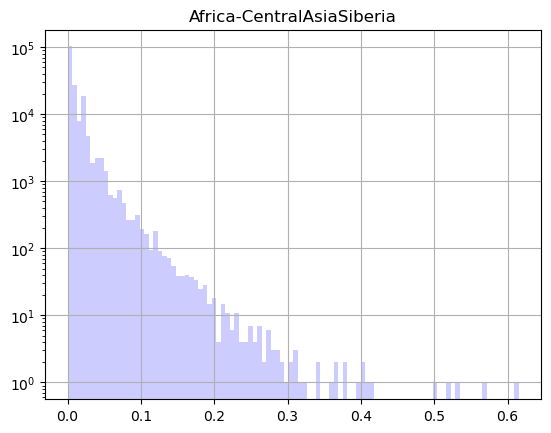

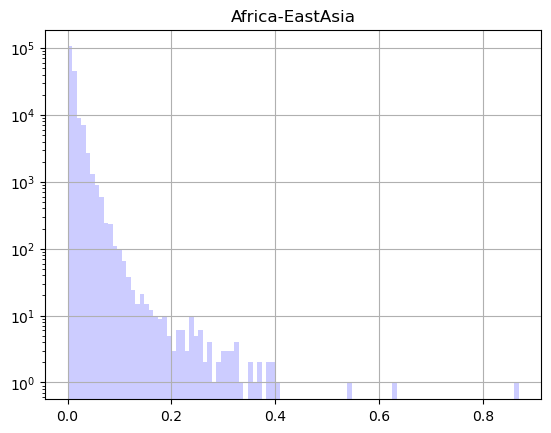

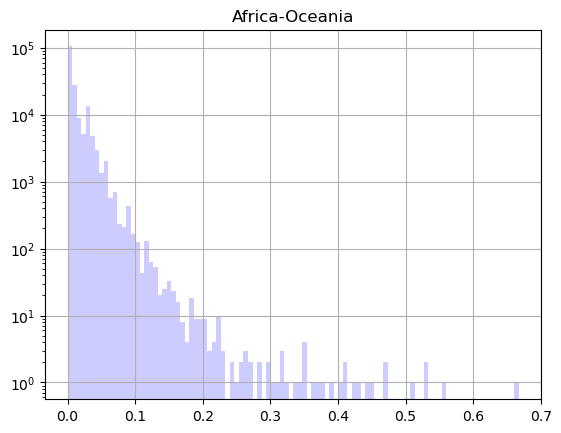

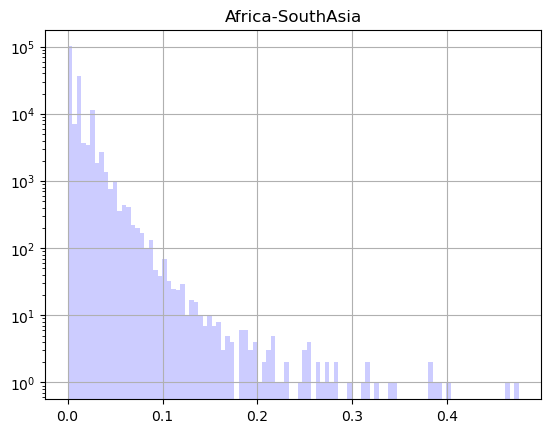

...

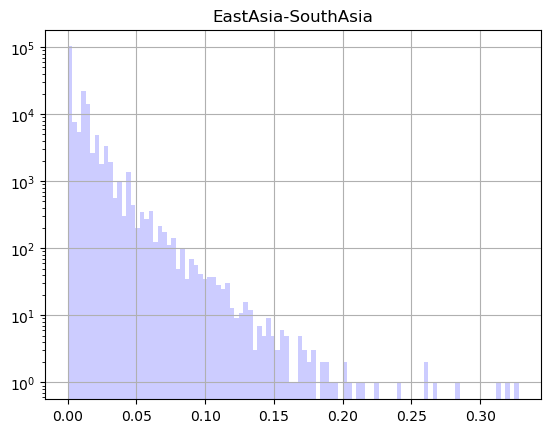

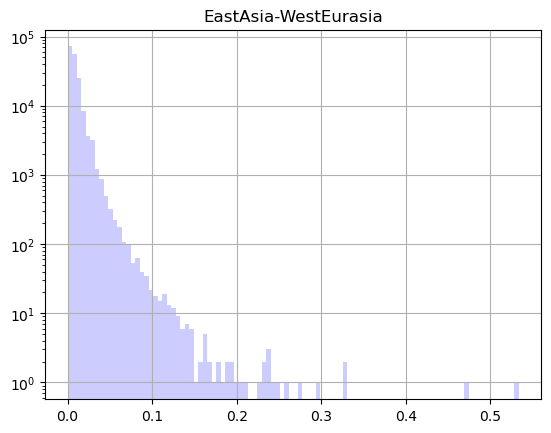

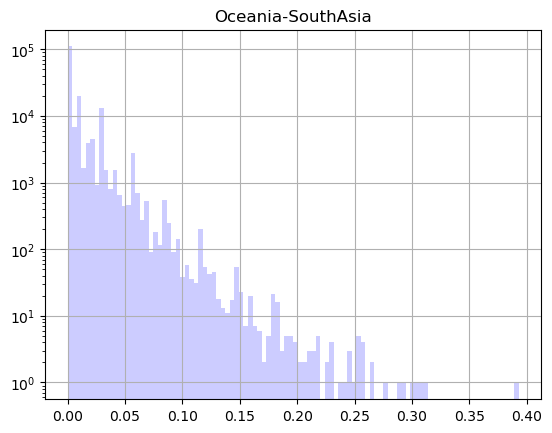

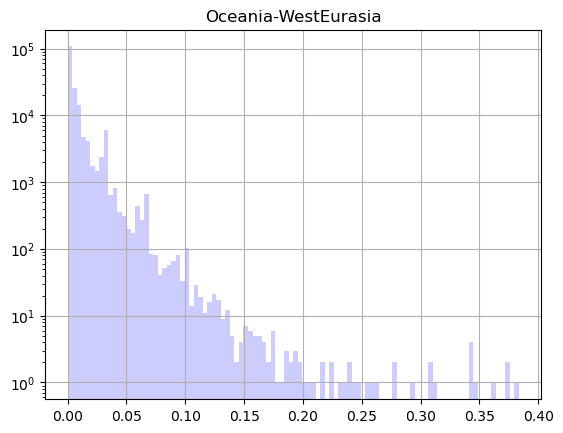

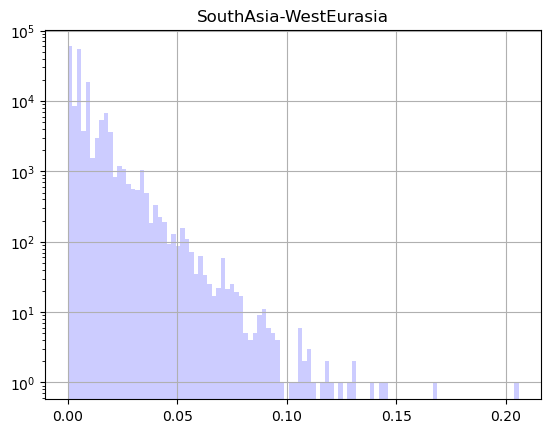

In [39]:
for col in vst_dt.iloc[:,3:25].columns: 
    try:      
        vst_dt.iloc[:,3:25][col] = pd.to_numeric(vst_dt.iloc[:,3:25][col]) 
        vst_dt.iloc[:,3:25].hist(column=col, bins=100, alpha=0.2, color="blue", log=True)
    except ValueError:
        print('This column can not be represented as a histogram')

<Axes: >

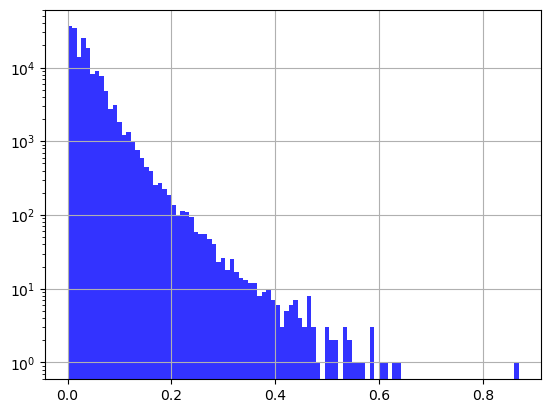

In [40]:
vst_dt.iloc[:,3:25].max(axis=1).hist(bins=100, alpha=0.8, log=True, color="blue")

In [41]:
#vst_dt[vst_dt['Type']=='duplication'].sort_values(by='Oceania-WestEurasia', ascending=False).head(200)

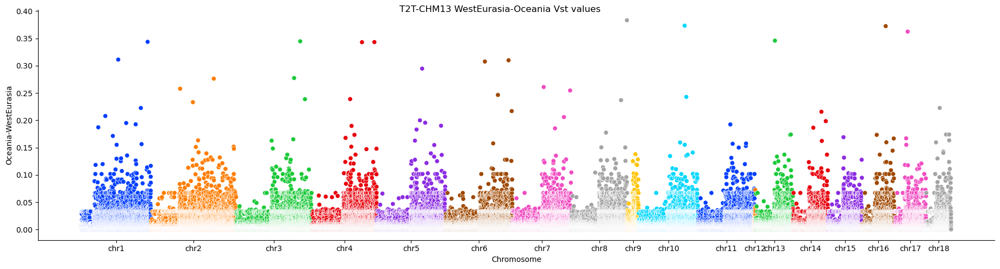

In [42]:
# Simulate DataFrame
#vst_dt['i']= vst_dt.index
vst_dt["i"] = pd.to_numeric(vst_dt.index, downcast="float")

#vst_dt['log_West_Oceania'] = np.log2(vst_dt['WestEurasia-Oceania'])

# Generate Manhattan plot: (#optional tweaks for relplot: linewidth=0, s=9)
plot = sns.relplot(data=vst_dt, x='i', y='Oceania-WestEurasia', aspect=3.7, 
                  hue='Chromosome', palette = 'bright', legend=None) 
chrom_df=vst_dt.groupby('Chromosome')['i'].median()
plot.ax.set_xlabel('Chromosome'); plot.ax.set_xticks(chrom_df);
plot.ax.set_xticklabels(chrom_df.index)
plot.fig.suptitle('T2T-CHM13 WestEurasia-Oceania Vst values');

In [43]:
vst_dt_filtered = vst_dt.iloc[filtering_vst.T.index]
vst_dt_filtered#.sort_values(by=['WestEurasia-Oceania'], ascending=False).head(50)

,Chromosome,Start,End,Africa-America,Africa-CentralAsiaSiberia,Africa-EastAsia,Africa-Oceania,Africa-SouthAsia,Africa-WestEurasia,America-CentralAsiaSiberia,...,CentralAsiaSiberia-Oceania,CentralAsiaSiberia-SouthAsia,CentralAsiaSiberia-WestEurasia,EastAsia-Oceania,EastAsia-SouthAsia,EastAsia-WestEurasia,Oceania-SouthAsia,Oceania-WestEurasia,SouthAsia-WestEurasia,i
2875,chr1,4119209,4123876,0.00358,0.07555,0.00279,0.01831,0.13432,0.06417,0.13336,...,0.02944,0.02199,0.00108,0.00745,0.10270,0.04197,0.08546,0.01125,0.01342,2875.0
2989,chr1,5373793,5375048,0.11646,0.15901,0.04903,0.00529,0.01122,0.00745,0.46901,...,0.26430,0.09410,0.08024,0.02359,0.10044,0.08628,0.03249,0.02018,0.00023,2989.0
3197,chr1,7884464,7898408,0.00137,0.19214,0.00663,0.00171,0.07493,0.01380,0.20801,...,0.12990,0.04874,0.08173,0.00089,0.03247,0.00126,0.03888,0.00345,0.01988,3197.0
3276,chr1,9027078,9126952,0.11322,0.15759,0.04063,0.02407,0.00195,0.00094,0.36415,...,0.24866,0.14259,0.09496,0.00176,0.01992,0.04695,0.00919,0.02439,0.00466,3276.0
3285,chr1,9285874,9351410,0.23644,0.27229,0.04292,0.00510,0.09830,0.01985,0.00460,...,0.18713,0.05719,0.14793,0.01534,0.00937,0.00508,0.04876,0.00374,0.02938,3285.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
172853,chr18,66465013,66585794,0.10172,0.14927,0.04288,0.01066,0.08840,0.11119,0.01452,...,0.22360,0.02166,0.02464,0.09175,0.01185,0.01586,0.15292,0.17402,0.00001,172853.0
172885,chr18,67974136,67991293,0.04005,0.07557,0.01498,0.00284,0.00030,0.04565,0.23625,...,0.07493,0.07226,0.00018,0.00418,0.01115,0.01706,0.00141,0.02301,0.03944,172885.0
172889,chr18,68041106,68075150,0.01920,0.04145,0.07662,0.00000,0.04574,0.02373,0.00489,...,0.04368,0.00000,0.00099,0.06939,0.21308,0.15132,0.04452,0.01880,0.00124,172889.0
173001,chr18,71524229,71548201,0.01152,0.10119,0.00651,0.00115,0.00353,0.00841,0.20801,...,0.10336,0.06024,0.04435,0.00186,0.00026,0.00017,0.00062,0.00262,0.00078,173001.0


In [44]:
## Saving Vst coordinates as bed file to liftover

vst_dt_filtered.iloc[:,0:4].to_csv('vst_cnvrs_coordinates_chm13t2t.bed', header=False, index=False,sep='\t')
vst_dt_filtered

,Chromosome,Start,End,Africa-America,Africa-CentralAsiaSiberia,Africa-EastAsia,Africa-Oceania,Africa-SouthAsia,Africa-WestEurasia,America-CentralAsiaSiberia,...,CentralAsiaSiberia-Oceania,CentralAsiaSiberia-SouthAsia,CentralAsiaSiberia-WestEurasia,EastAsia-Oceania,EastAsia-SouthAsia,EastAsia-WestEurasia,Oceania-SouthAsia,Oceania-WestEurasia,SouthAsia-WestEurasia,i
2875,chr1,4119209,4123876,0.00358,0.07555,0.00279,0.01831,0.13432,0.06417,0.13336,...,0.02944,0.02199,0.00108,0.00745,0.10270,0.04197,0.08546,0.01125,0.01342,2875.0
2989,chr1,5373793,5375048,0.11646,0.15901,0.04903,0.00529,0.01122,0.00745,0.46901,...,0.26430,0.09410,0.08024,0.02359,0.10044,0.08628,0.03249,0.02018,0.00023,2989.0
3197,chr1,7884464,7898408,0.00137,0.19214,0.00663,0.00171,0.07493,0.01380,0.20801,...,0.12990,0.04874,0.08173,0.00089,0.03247,0.00126,0.03888,0.00345,0.01988,3197.0
3276,chr1,9027078,9126952,0.11322,0.15759,0.04063,0.02407,0.00195,0.00094,0.36415,...,0.24866,0.14259,0.09496,0.00176,0.01992,0.04695,0.00919,0.02439,0.00466,3276.0
3285,chr1,9285874,9351410,0.23644,0.27229,0.04292,0.00510,0.09830,0.01985,0.00460,...,0.18713,0.05719,0.14793,0.01534,0.00937,0.00508,0.04876,0.00374,0.02938,3285.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
172853,chr18,66465013,66585794,0.10172,0.14927,0.04288,0.01066,0.08840,0.11119,0.01452,...,0.22360,0.02166,0.02464,0.09175,0.01185,0.01586,0.15292,0.17402,0.00001,172853.0
172885,chr18,67974136,67991293,0.04005,0.07557,0.01498,0.00284,0.00030,0.04565,0.23625,...,0.07493,0.07226,0.00018,0.00418,0.01115,0.01706,0.00141,0.02301,0.03944,172885.0
172889,chr18,68041106,68075150,0.01920,0.04145,0.07662,0.00000,0.04574,0.02373,0.00489,...,0.04368,0.00000,0.00099,0.06939,0.21308,0.15132,0.04452,0.01880,0.00124,172889.0
173001,chr18,71524229,71548201,0.01152,0.10119,0.00651,0.00115,0.00353,0.00841,0.20801,...,0.10336,0.06024,0.04435,0.00186,0.00026,0.00017,0.00062,0.00262,0.00078,173001.0


<h1> Deletions 

In [45]:
cnv_passed_vst = cnvs.T.iloc[filtering_vst.T.index]
cnv_passed_vst

Sample,LP6005441-DNA_A03,LP6005441-DNA_A04,LP6005441-DNA_A05,LP6005441-DNA_A06,LP6005441-DNA_A08,LP6005441-DNA_A09,LP6005441-DNA_A10,LP6005441-DNA_A11,LP6005441-DNA_A12,LP6005441-DNA_B01,...,LP6005677-DNA_D03,LP6005677-DNA_E01,LP6005677-DNA_F01,LP6005677-DNA_G01,LP6007068-DNA_A01,LP6007069-DNA_A01,SS6004471,SS6004477,SS6004478,SS6004480
2875,2.0,2.0,2.0,2.0,2.000000,2.000000,2.0,2.0,1.0,2.000000,...,2.000000,1.0,2.0,2.0,2.00,2.00,1.00,2.000000,2.000000,2.00
2989,2.0,35.0,39.0,40.0,35.000000,31.000000,31.0,30.0,38.0,29.000000,...,8.000000,31.0,37.0,2.0,9.00,11.00,30.00,26.000000,42.000000,12.00
3197,2.0,2.0,1.0,1.0,2.000000,1.000000,1.0,1.0,2.0,2.000000,...,1.000000,1.0,2.0,2.0,1.00,2.00,2.00,3.000000,2.000000,2.00
3276,2.0,9.5,8.0,10.5,6.333333,6.333333,3.8,8.5,10.0,6.666667,...,3.666667,7.0,7.0,1.0,2.25,1.90,2.50,3.285714,4.500000,3.75
3285,1.0,3.0,3.0,3.0,2.000000,3.000000,3.0,2.0,3.0,3.000000,...,3.000000,1.8,3.0,2.0,2.00,3.00,3.00,3.000000,2.000000,3.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
172853,2.0,2.0,2.0,2.0,2.000000,2.000000,1.0,1.0,2.0,2.000000,...,2.000000,2.0,2.0,2.0,2.00,2.00,1.00,1.000000,1.000000,2.00
172885,1.0,2.0,2.0,2.0,2.000000,2.000000,2.0,2.0,2.0,2.000000,...,2.000000,1.0,2.0,2.0,1.00,1.00,2.00,1.000000,1.000000,2.00
172889,2.0,2.0,2.0,1.0,2.000000,1.000000,1.0,2.0,2.0,2.000000,...,2.000000,2.0,2.0,1.0,2.00,2.00,1.00,2.000000,1.000000,1.00
173001,1.0,1.0,2.0,2.0,1.000000,1.000000,1.0,2.0,1.0,2.000000,...,2.000000,2.0,1.0,2.0,1.00,2.00,2.00,2.000000,2.000000,1.00


In [46]:
cnv_passed_vst = cnv_passed_vst[(cnv_passed_vst[cnv_passed_vst.columns[1:]]<3).all(axis=1)]
counts = cnv_passed_vst.T
counts = counts.sort_index()
counts

,4084,4181,4715,4741,5418,5554,5681,6940,7539,9349,...,166897,167473,167504,170346,171110,171297,171708,172832,172839,172851
Sample,,,,,,,,,,,,,,,,,,,,,
LP6005441-DNA_A03,2.0,1.0,2.0,1.0,2.0,2.0,2.0,1.0,2.0,2.0,...,1.0,1.000000,2.0,2.0,1.0,2.0,2.0,2.0,2.0,1.0
LP6005441-DNA_A04,2.0,2.0,2.0,2.0,2.0,1.0,2.0,1.0,1.0,2.0,...,2.0,1.000000,2.0,2.0,2.0,1.0,2.0,2.0,1.0,1.0
LP6005441-DNA_A05,2.0,1.0,1.0,2.0,2.0,1.0,2.0,2.0,1.0,2.0,...,2.0,0.333333,2.0,2.0,2.0,2.0,2.0,1.0,2.0,2.0
LP6005441-DNA_A06,2.0,2.0,1.0,2.0,2.0,2.0,2.0,2.0,1.0,2.0,...,2.0,2.000000,2.0,2.0,2.0,1.0,2.0,2.0,2.0,1.0
LP6005441-DNA_A08,1.0,1.0,1.0,1.0,2.0,2.0,1.0,2.0,1.0,1.0,...,2.0,2.000000,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
LP6007069-DNA_A01,2.0,1.0,2.0,2.0,2.0,2.0,1.0,2.0,2.0,1.0,...,2.0,1.000000,2.0,1.0,2.0,2.0,0.5,2.0,2.0,1.0
SS6004471,2.0,1.0,1.0,1.0,2.0,2.0,1.0,2.0,2.0,1.0,...,1.0,1.000000,2.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0
SS6004477,2.0,1.0,2.0,1.0,2.0,2.0,1.0,1.0,1.0,1.0,...,2.0,1.000000,2.0,1.0,2.0,1.0,1.0,2.0,2.0,1.0


In [47]:
#PCA

x = StandardScaler().fit_transform(counts)
pca = PCA(n_components=10)
pca_results = pca.fit_transform(x)

df_pca= pd.DataFrame(pca_results,
                          columns=['component_1','component_2', 'component_3', 'component_4',
                                  'component_5',
                                  'component_6',
                                  'component_7',
                                  'component_8',
                                  'component_9',
                                   'component_10'
                                  ],
                          index=features.index)




df_pca = features.merge(df_pca, left_index=True, right_index=True)
pca.explained_variance_ratio_

array([0.08579246, 0.03188278, 0.02920657, 0.02113402, 0.01811782,
       0.01646725, 0.01397673, 0.01374014, 0.01328071, 0.01295294])

             component_1  component_2  component_3  component_4  component_5  \
Region                                                                         
Oceania         0.482727     1.756488     1.520064    -2.008944    -1.354115   
America        -3.773677    -2.781773     1.046859     6.079692    -0.537666   
WestEurasia    -2.107559     0.326122    -2.306827     2.488861     1.001738   
WestEurasia    -4.068555     0.481375    -1.176468     0.774945     0.194865   
Africa          1.619126     4.493389    -1.218895    -1.031757    -1.302664   
...                  ...          ...          ...          ...          ...   
WestEurasia     5.631385     1.063743     4.670707    -0.020147     5.008738   
Africa          2.276295     6.078028    10.711782     1.170134     3.937587   
Oceania         2.438745     2.012187    12.739742    -1.645790     1.828830   
Oceania         1.859638     2.956054    14.454676    -1.840514     0.853075   
Africa         -0.559952     8.356961   

Count of groups by factor: 7
             component_1  component_2  component_3  component_4  component_5  \
Region                                                                         
Oceania         0.482727     1.756488     1.520064    -2.008944    -1.354115   
America        -3.773677    -2.781773     1.046859     6.079692    -0.537666   
WestEurasia    -2.107559     0.326122    -2.306827     2.488861     1.001738   
WestEurasia    -4.068555     0.481375    -1.176468     0.774945     0.194865   
Africa          1.619126     4.493389    -1.218895    -1.031757    -1.302664   
...                  ...          ...          ...          ...          ...   
WestEurasia     5.631385     1.063743     4.670707    -0.020147     5.008738   
Africa          2.276295     6.078028    10.711782     1.170134     3.937587   
Oceania         2.438745     2.012187    12.739742    -1.645790     1.828830   
Oceania         1.859638     2.956054    14.454676    -1.840514     0.853075   
Africa     

/Users/luciabazan/Documents/GitHub/cnv_sgdp/scripts/pca_plot.py:50: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  figure = matplotlib.pyplot.figure(


             component_1  component_2  component_3  component_4  component_5  \
Region                                                                         
Oceania         0.482727     1.756488     1.520064    -2.008944    -1.354115   
America        -3.773677    -2.781773     1.046859     6.079692    -0.537666   
WestEurasia    -2.107559     0.326122    -2.306827     2.488861     1.001738   
WestEurasia    -4.068555     0.481375    -1.176468     0.774945     0.194865   
Africa          1.619126     4.493389    -1.218895    -1.031757    -1.302664   
...                  ...          ...          ...          ...          ...   
WestEurasia     5.631385     1.063743     4.670707    -0.020147     5.008738   
Africa          2.276295     6.078028    10.711782     1.170134     3.937587   
Oceania         2.438745     2.012187    12.739742    -1.645790     1.828830   
Oceania         1.859638     2.956054    14.454676    -1.840514     0.853075   
Africa         -0.559952     8.356961   

             component_1  component_2  component_3  component_4  component_5  \
Region                                                                         
Oceania         0.482727     1.756488     1.520064    -2.008944    -1.354115   
America        -3.773677    -2.781773     1.046859     6.079692    -0.537666   
WestEurasia    -2.107559     0.326122    -2.306827     2.488861     1.001738   
WestEurasia    -4.068555     0.481375    -1.176468     0.774945     0.194865   
Africa          1.619126     4.493389    -1.218895    -1.031757    -1.302664   
...                  ...          ...          ...          ...          ...   
WestEurasia     5.631385     1.063743     4.670707    -0.020147     5.008738   
Africa          2.276295     6.078028    10.711782     1.170134     3.937587   
Oceania         2.438745     2.012187    12.739742    -1.645790     1.828830   
Oceania         1.859638     2.956054    14.454676    -1.840514     0.853075   
Africa         -0.559952     8.356961   

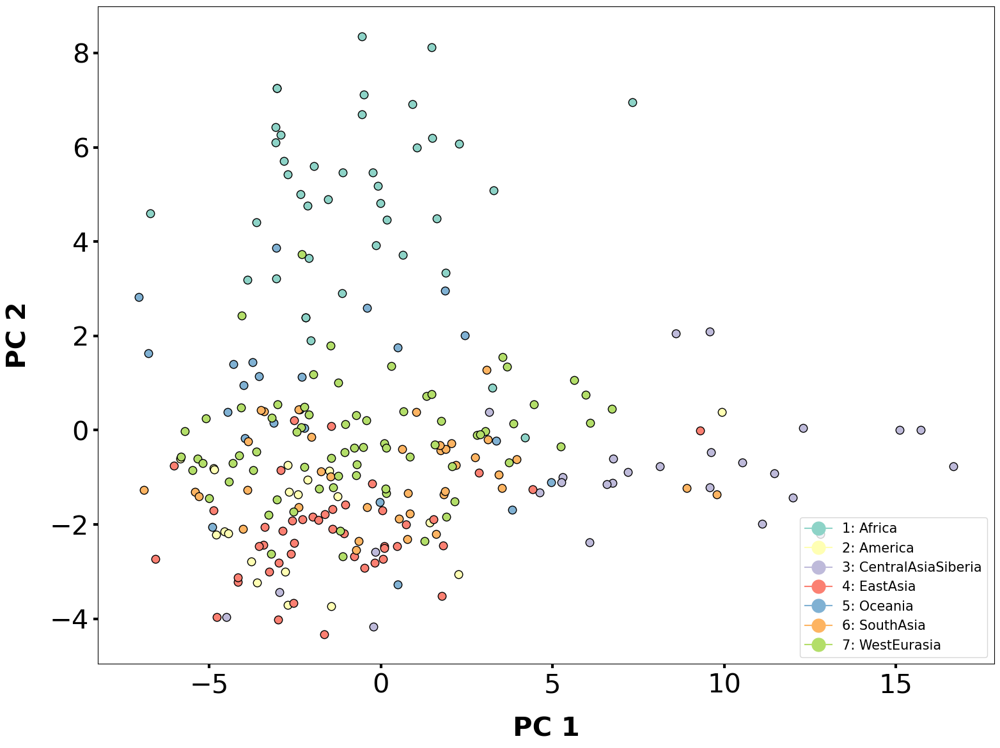

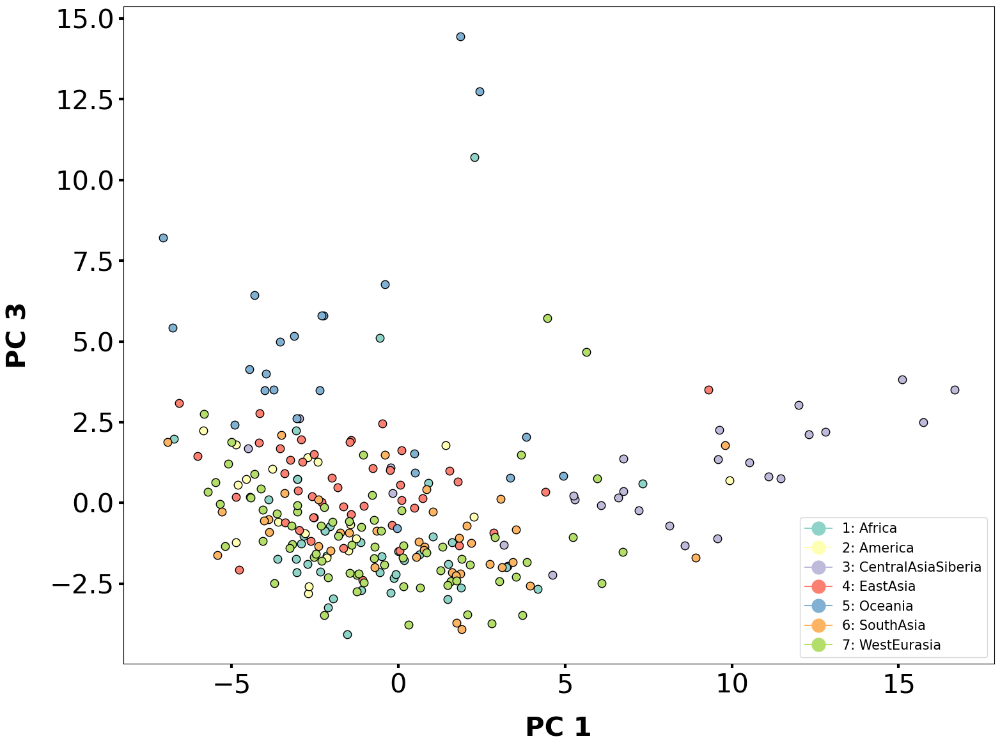

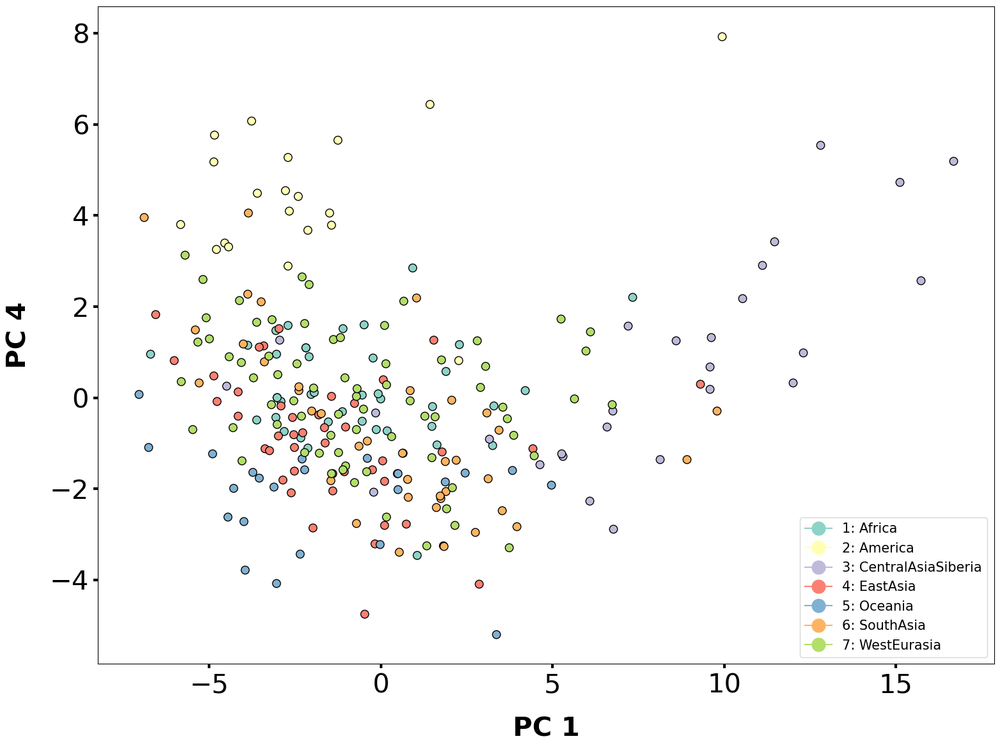

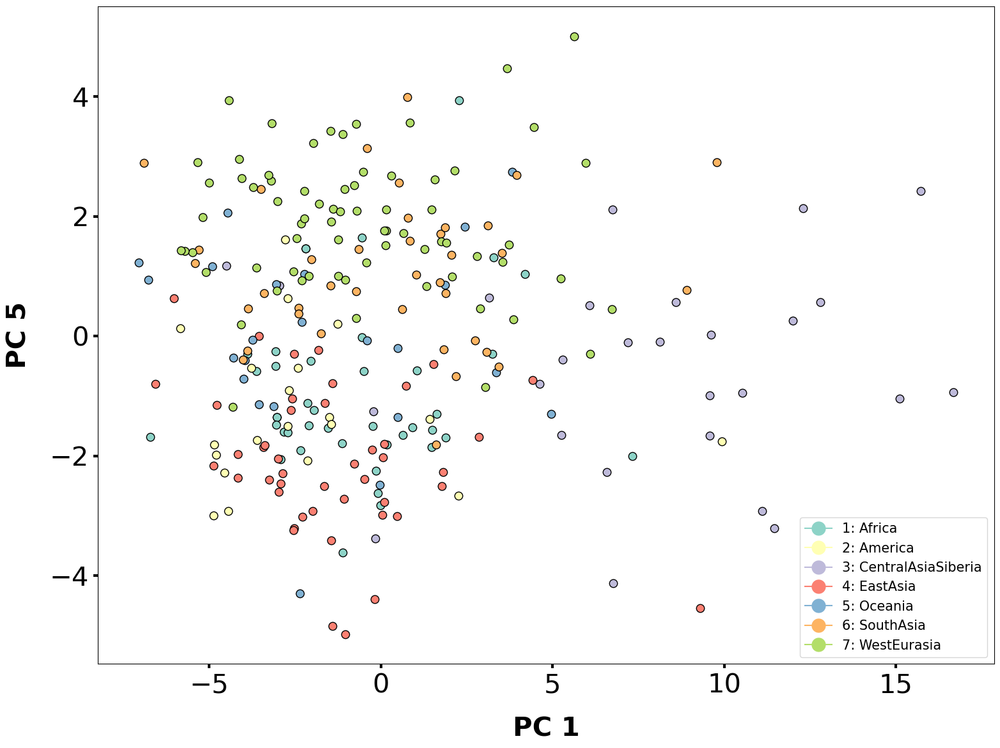

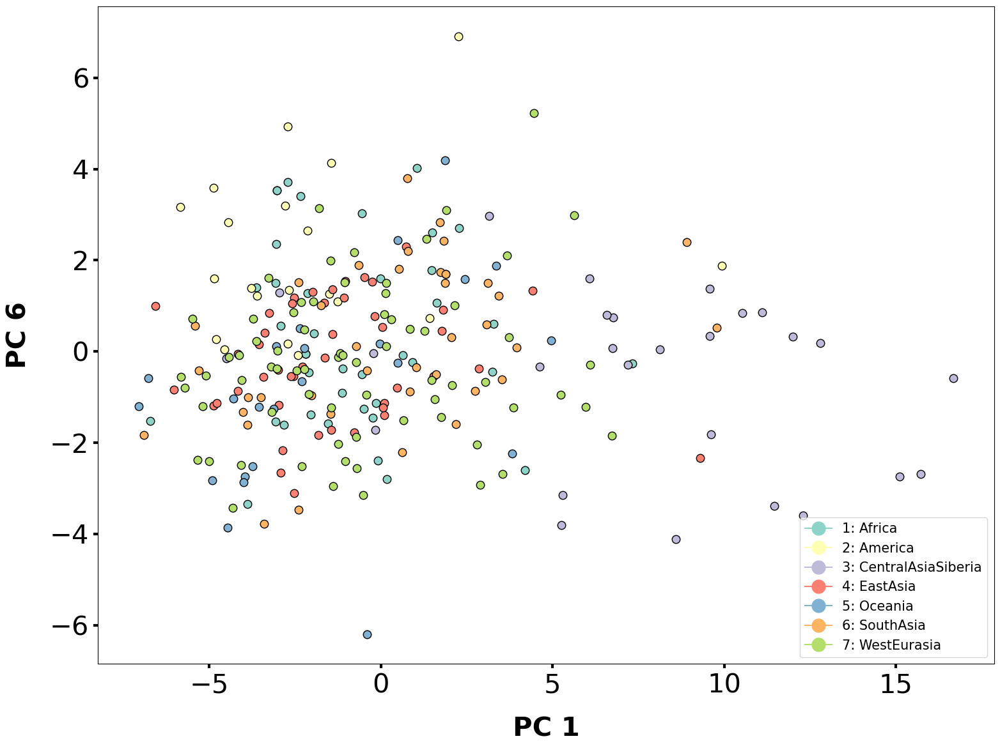

...

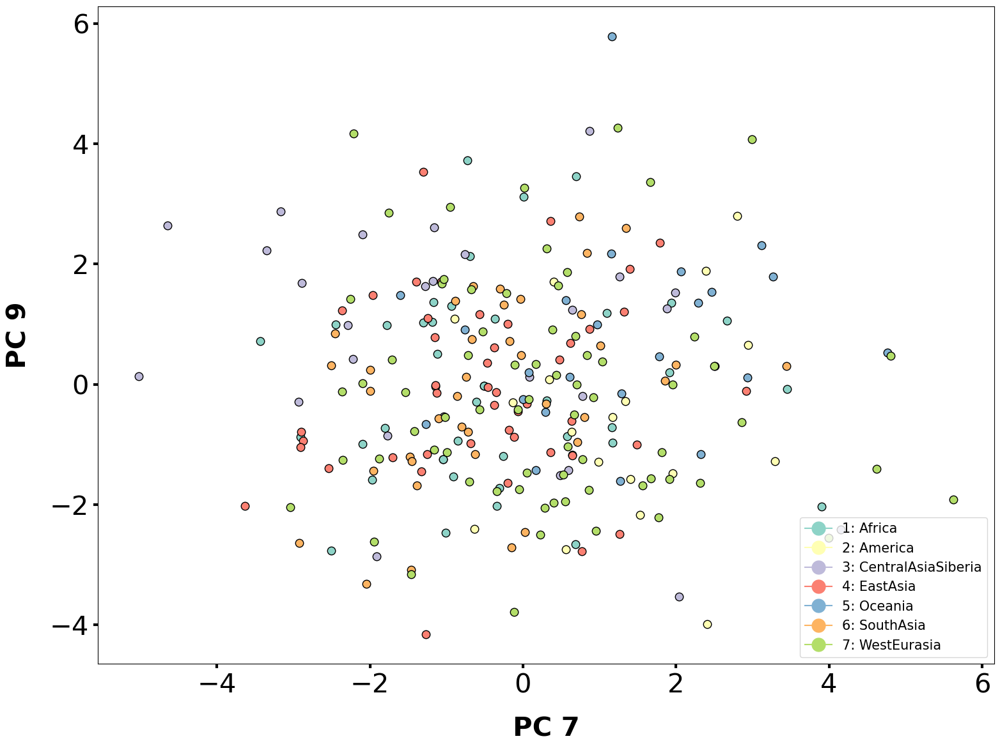

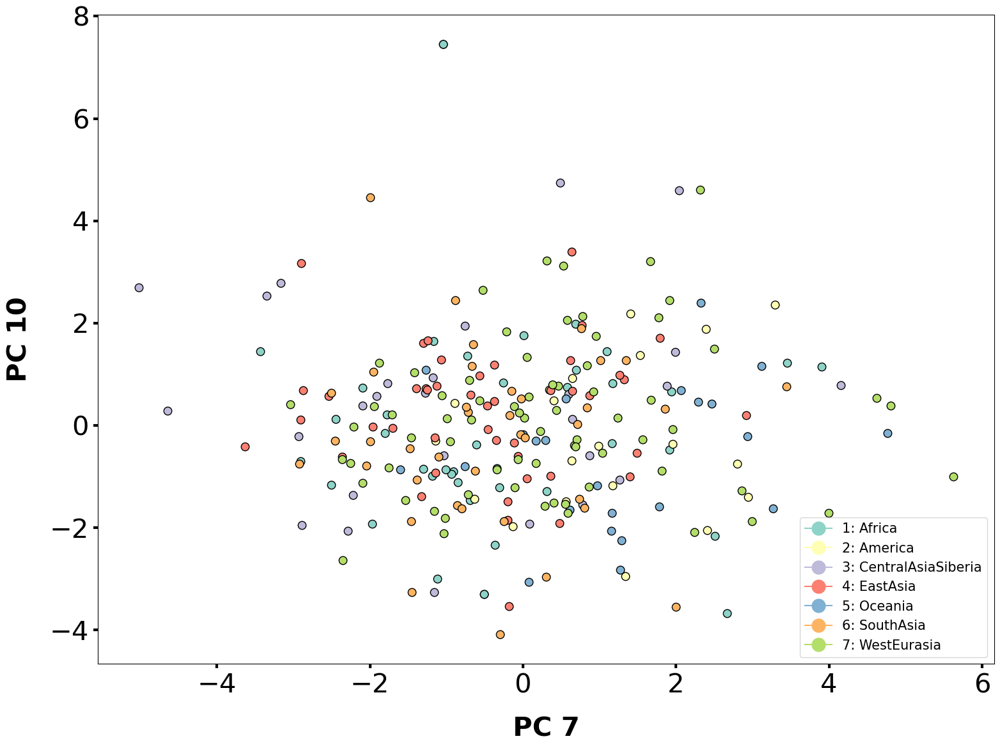

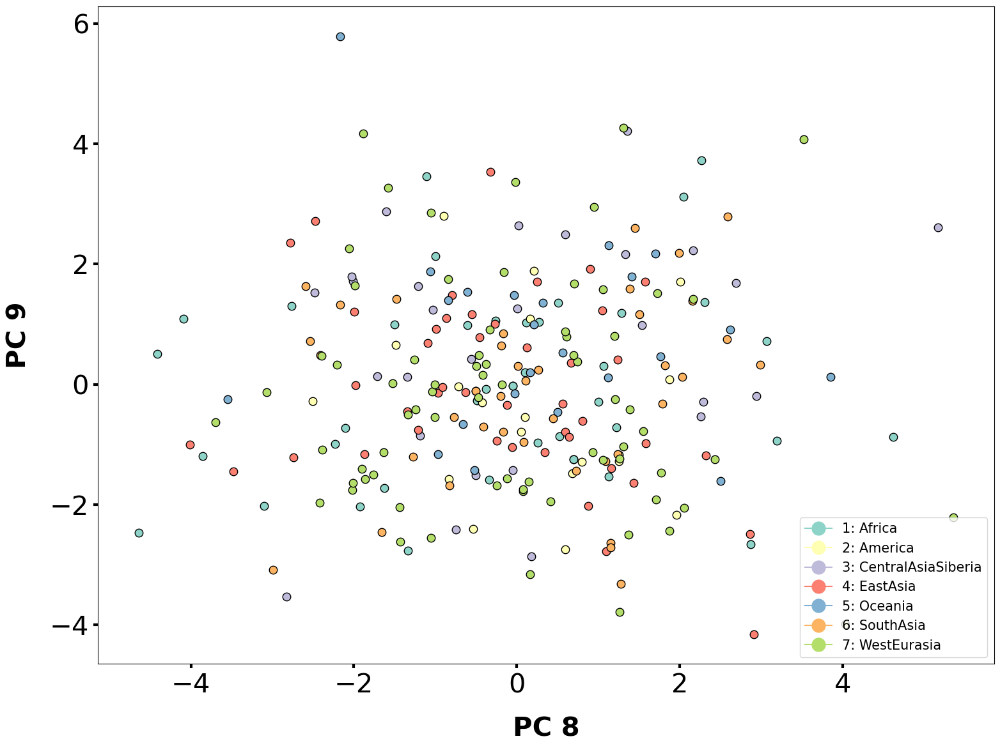

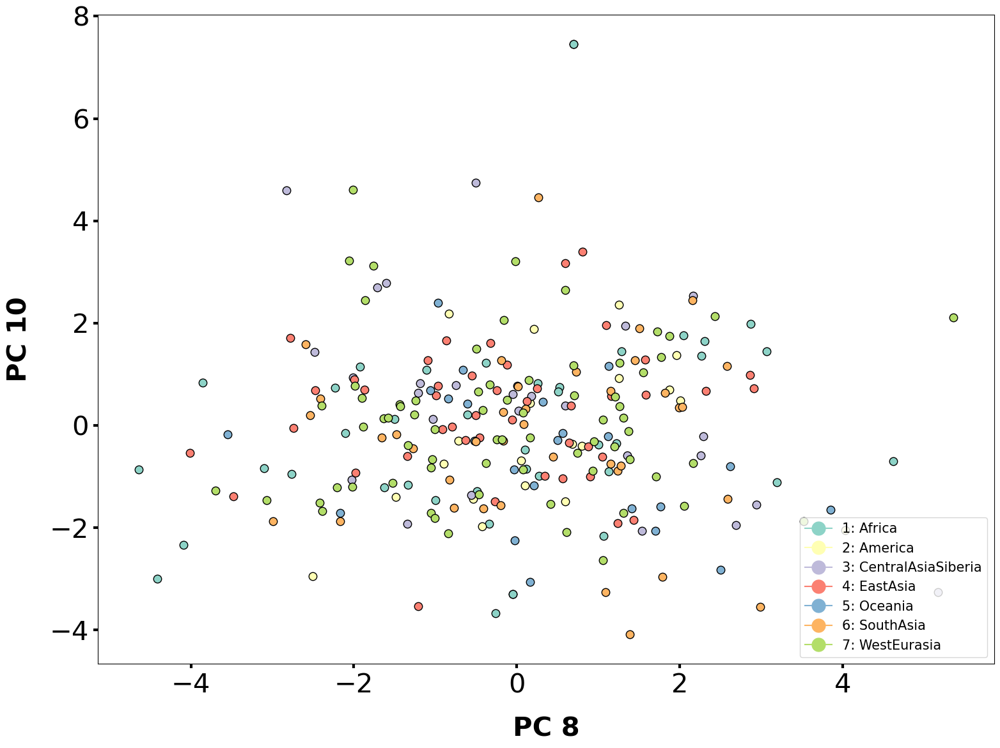

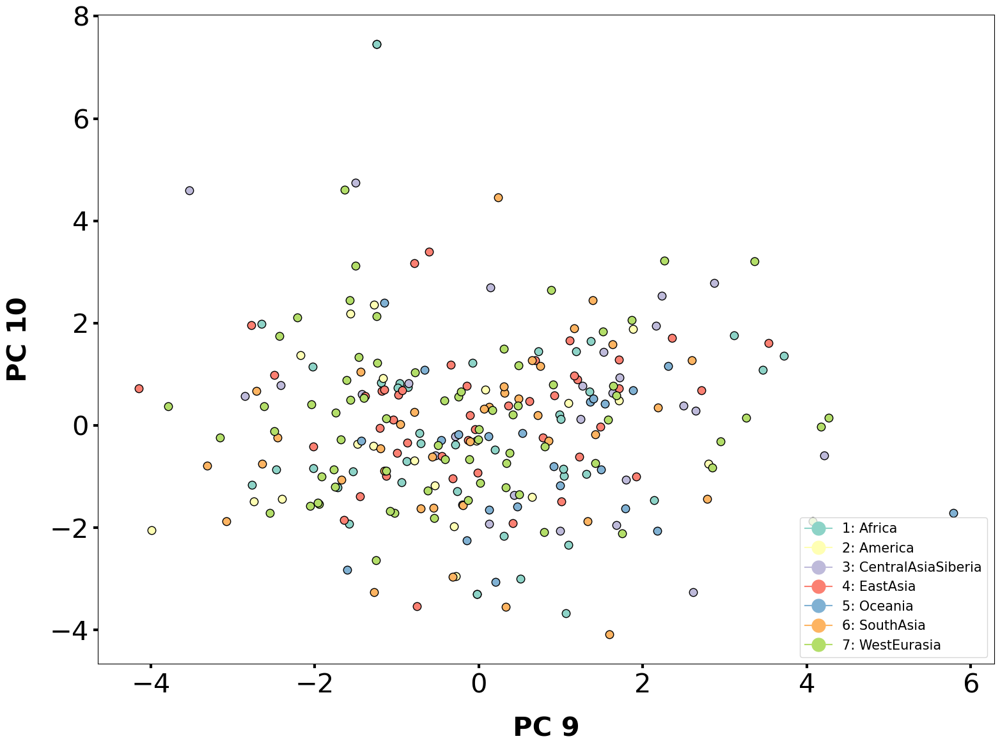

In [48]:
components = [1,2,3,4,5,6,7,8,9,10]

combinations_components = list(combinations(components,2))
for i in combinations_components:
    plot_scatter_cluster(data=df_pca, abscissa='component_'+str(i[0]), ordinate='component_'+str(i[1]), label_horizontal='PC '+ str(i[0]), label_vertical='PC '+str(i[1]), factor='Region', fonts=define_font_properties(), colors=define_color_properties(), legend=True)
    #print(str(i[0]))

             component_1  component_2  component_3  component_4  component_5  \
Region                                                                         
Oceania         0.482727     1.756488     1.520064    -2.008944    -1.354115   
America        -3.773677    -2.781773     1.046859     6.079692    -0.537666   
WestEurasia    -2.107559     0.326122    -2.306827     2.488861     1.001738   
WestEurasia    -4.068555     0.481375    -1.176468     0.774945     0.194865   
Africa          1.619126     4.493389    -1.218895    -1.031757    -1.302664   
...                  ...          ...          ...          ...          ...   
WestEurasia     5.631385     1.063743     4.670707    -0.020147     5.008738   
Africa          2.276295     6.078028    10.711782     1.170134     3.937587   
Oceania         2.438745     2.012187    12.739742    -1.645790     1.828830   
Oceania         1.859638     2.956054    14.454676    -1.840514     0.853075   
Africa         -0.559952     8.356961   

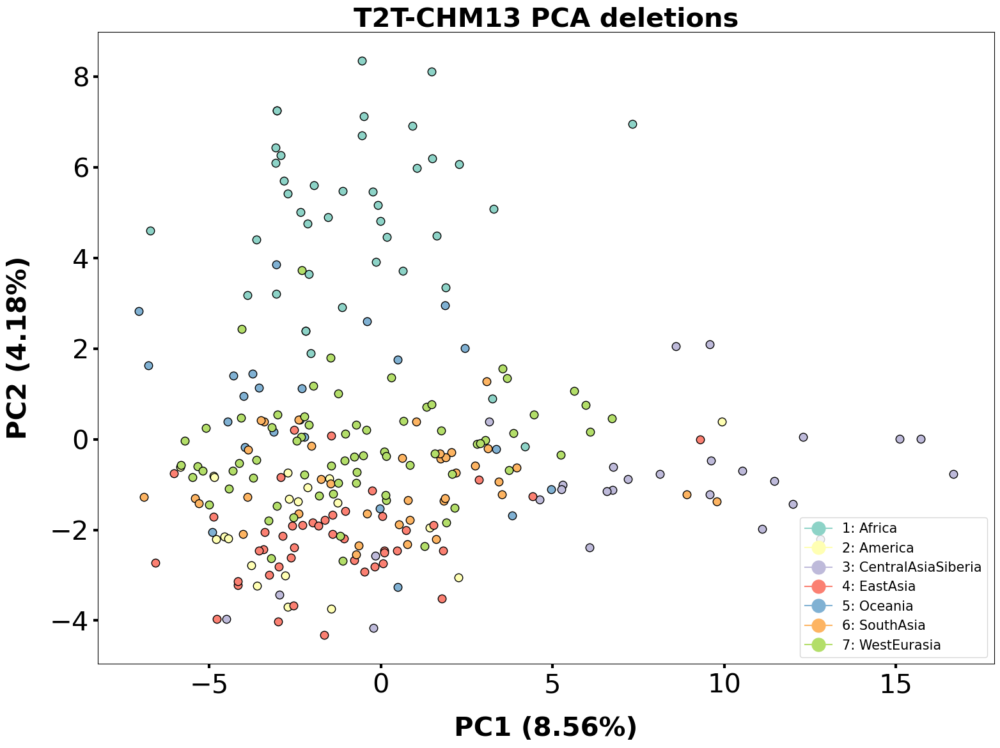

In [132]:
plot_scatter_cluster(data=df_pca, abscissa='component_1', ordinate='component_2', label_horizontal='PC1 (8.56%)', label_vertical='PC2 (4.18%)', factor='Region', fonts=define_font_properties(), colors=define_color_properties(), legend=True)
plt.title("T2T-CHM13 PCA deletions", size=30, fontweight="bold")

plt.savefig('../plots/t2t_chm13_pca_deletions_pc12_cnvr.png', transparent=True)

             component_1  component_2  component_3  component_4  component_5  \
Region                                                                         
Oceania         0.482727     1.756488     1.520064    -2.008944    -1.354115   
America        -3.773677    -2.781773     1.046859     6.079692    -0.537666   
WestEurasia    -2.107559     0.326122    -2.306827     2.488861     1.001738   
WestEurasia    -4.068555     0.481375    -1.176468     0.774945     0.194865   
Africa          1.619126     4.493389    -1.218895    -1.031757    -1.302664   
...                  ...          ...          ...          ...          ...   
WestEurasia     5.631385     1.063743     4.670707    -0.020147     5.008738   
Africa          2.276295     6.078028    10.711782     1.170134     3.937587   
Oceania         2.438745     2.012187    12.739742    -1.645790     1.828830   
Oceania         1.859638     2.956054    14.454676    -1.840514     0.853075   
Africa         -0.559952     8.356961   

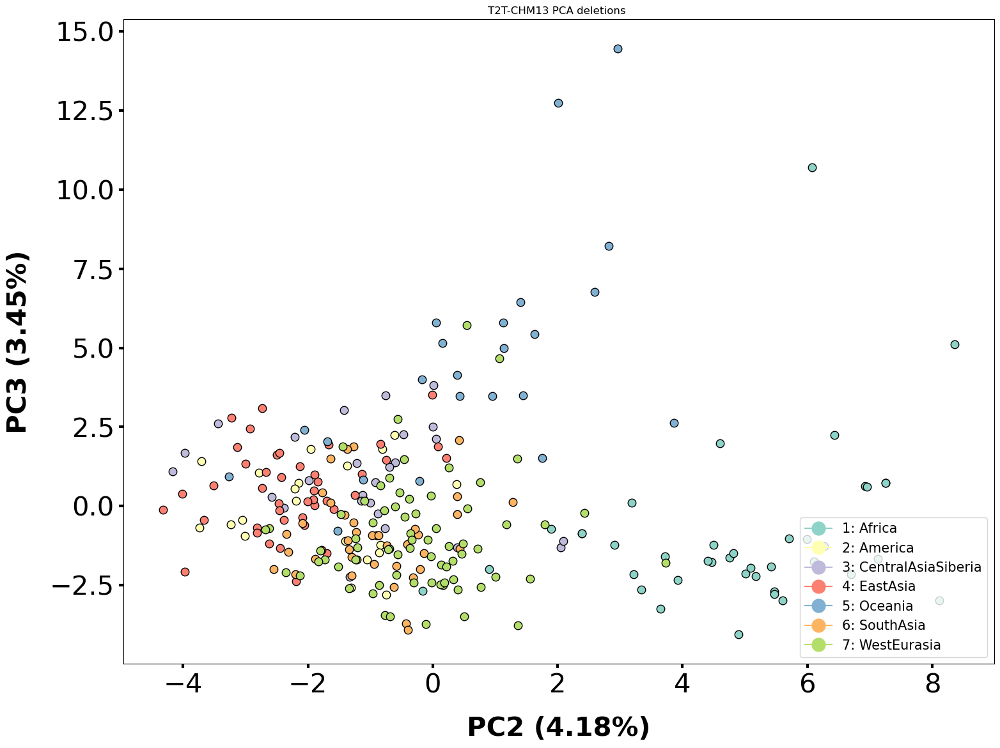

In [123]:
plot_scatter_cluster(data=df_pca, abscissa='component_2', ordinate='component_3', label_horizontal='PC2 (4.18%)', label_vertical='PC3 (3.45%)', factor='Region', fonts=define_font_properties(), colors=define_color_properties(), legend=True)
plt.title("T2T-CHM13 PCA deletions ")

plt.savefig('../plots/t2t_chm13_pca_deletions_pc23_cnvr.png', transparent=True)

<h1> Duplications

In [124]:
cnv_passed_vst = cnvs.T.iloc[filtering_vst.T.index]

cnv_passed_vst = cnv_passed_vst[(cnv_passed_vst[cnv_passed_vst.columns[1:]]>1).any(axis=1)]
cnv_passed_vst = cnv_passed_vst[(cnv_passed_vst[cnv_passed_vst.columns[1:]]<5).all(axis=1)]
counts = cnv_passed_vst.T
counts = counts.sort_index()
counts

,2875,3197,3285,3303,3354,3358,3394,3545,4062,4084,...,172832,172833,172839,172848,172851,172853,172885,172889,173001,173201
Sample,,,,,,,,,,,,,,,,,,,,,
LP6005441-DNA_A03,2.0,2.0,1.0,2.0,2.0,2.0,1.000000,1.0,2.333333,2.0,...,2.0,2.0,2.0,1.000000,1.0,2.0,1.0,2.0,1.0,2.000000
LP6005441-DNA_A04,2.0,2.0,3.0,2.0,2.0,2.0,3.000000,2.0,3.000000,2.0,...,2.0,1.0,1.0,1.000000,1.0,2.0,2.0,2.0,1.0,2.000000
LP6005441-DNA_A05,2.0,1.0,3.0,2.0,2.0,2.0,3.000000,1.0,4.000000,2.0,...,1.0,1.0,2.0,1.000000,2.0,2.0,2.0,2.0,2.0,2.000000
LP6005441-DNA_A06,2.0,1.0,3.0,2.0,2.0,2.0,2.000000,2.0,3.500000,2.0,...,2.0,2.0,2.0,1.000000,1.0,2.0,2.0,1.0,2.0,2.000000
LP6005441-DNA_A08,2.0,2.0,2.0,2.0,2.0,1.0,2.000000,1.0,2.333333,1.0,...,2.0,2.0,2.0,0.500000,2.0,2.0,2.0,2.0,1.0,2.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
LP6007069-DNA_A01,2.0,2.0,3.0,2.0,1.0,1.0,1.666667,2.0,2.666667,2.0,...,2.0,1.0,2.0,1.000000,1.0,2.0,1.0,2.0,2.0,1.250000
SS6004471,1.0,2.0,3.0,1.0,1.0,1.0,1.000000,1.0,2.666667,2.0,...,1.0,1.0,1.0,0.714286,1.0,1.0,2.0,1.0,2.0,0.750000
SS6004477,2.0,3.0,3.0,2.0,1.0,2.0,1.000000,3.0,2.666667,2.0,...,2.0,1.0,2.0,2.000000,1.0,1.0,1.0,2.0,2.0,1.500000


In [125]:
#PCA

x = StandardScaler().fit_transform(counts)
pca = PCA(n_components=10)
pca_results = pca.fit_transform(x)

df_pca= pd.DataFrame(pca_results,
                          columns=['component_1','component_2', 'component_3', 'component_4',
                                  'component_5',
                                  'component_6',
                                  'component_7',
                                  'component_8',
                                  'component_9',
                                   'component_10'
                                  ],
                          index=features.index)




df_pca = features.merge(df_pca, left_index=True, right_index=True)
pca.explained_variance_ratio_

array([0.11474833, 0.02903091, 0.02828352, 0.02056673, 0.01499558,
       0.01253913, 0.01172396, 0.00960206, 0.00909256, 0.00843797])

             component_1  component_2  component_3  component_4  component_5  \
Region                                                                         
Oceania        -1.056656     8.520265     1.760356     1.232522    -2.468826   
America       -10.193391    -0.413973     2.372003    -6.111363     7.439280   
WestEurasia    -3.970056     2.780887    -7.336100    -2.345398    -1.057836   
WestEurasia    -8.175982    -6.470124    -2.519131    -0.833519     1.029151   
Africa          3.526200     8.107529    -2.853962     8.729177     3.084986   
...                  ...          ...          ...          ...          ...   
WestEurasia     9.947591     3.876630    13.326865     3.849094    -6.877649   
Africa         -5.447319    11.251291    22.960162    15.166761     1.514543   
Oceania        -4.272133     7.874659    26.349836     7.642417    -3.180138   
Oceania        -4.008767     7.847174    26.965114     7.530591    -4.276449   
Africa          1.232514    13.285954   

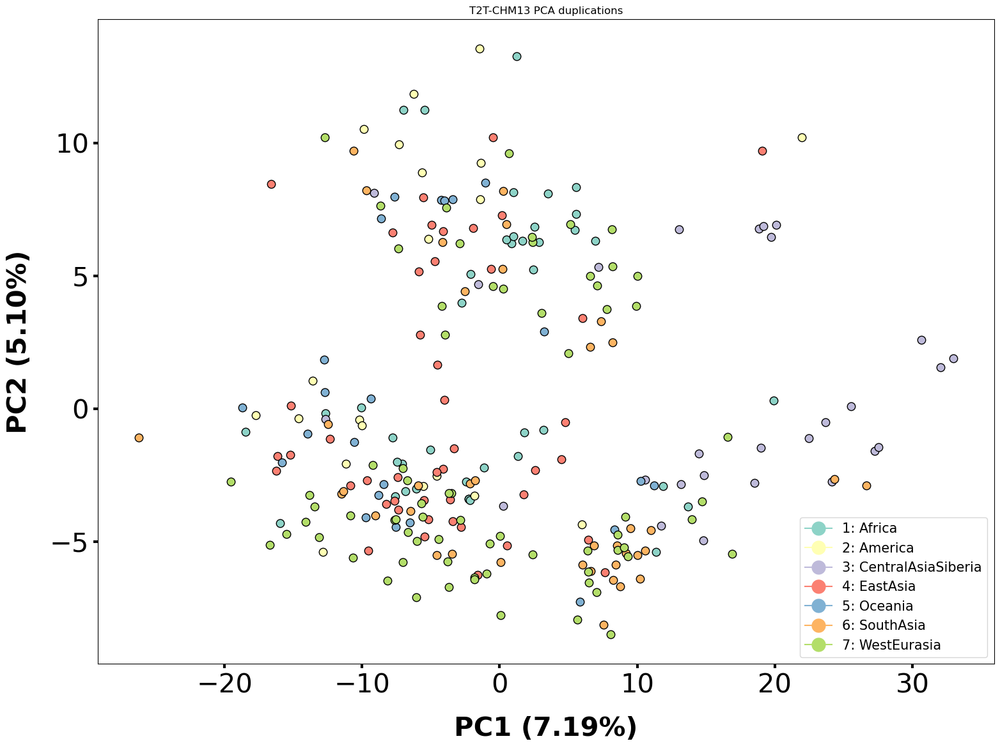

In [126]:
plot_scatter_cluster(data=df_pca, abscissa='component_1', ordinate='component_2', label_horizontal='PC1 (7.19%)', label_vertical='PC2 (5.10%)', factor='Region', fonts=define_font_properties(), colors=define_color_properties(), legend=True)
plt.title("T2T-CHM13 PCA duplications")

plt.savefig('../plots/t2t_chm13_pca_duplications_pc12_cnvr.png', transparent=True)

             component_1  component_2  component_3  component_4  component_5  \
Region                                                                         
Oceania        -1.056656     8.520344     1.760407     1.233268    -2.464798   
America       -10.193391    -0.414007     2.372123    -6.112513     7.443216   
WestEurasia    -3.970056     2.780878    -7.336102    -2.345541    -1.055970   
WestEurasia    -8.175982    -6.470137    -2.519105    -0.834249     1.030645   
Africa          3.526200     8.107496    -2.853954     8.729495     3.089414   
...                  ...          ...          ...          ...          ...   
WestEurasia     9.947591     3.876513    13.326808     3.847475    -6.892111   
Africa         -5.447319    11.251318    22.960158    15.166378     1.516990   
Oceania        -4.272133     7.874774    26.349856     7.642442    -3.176473   
Oceania        -4.008767     7.847227    26.965097     7.530920    -4.274634   
Africa          1.232514    13.285908   

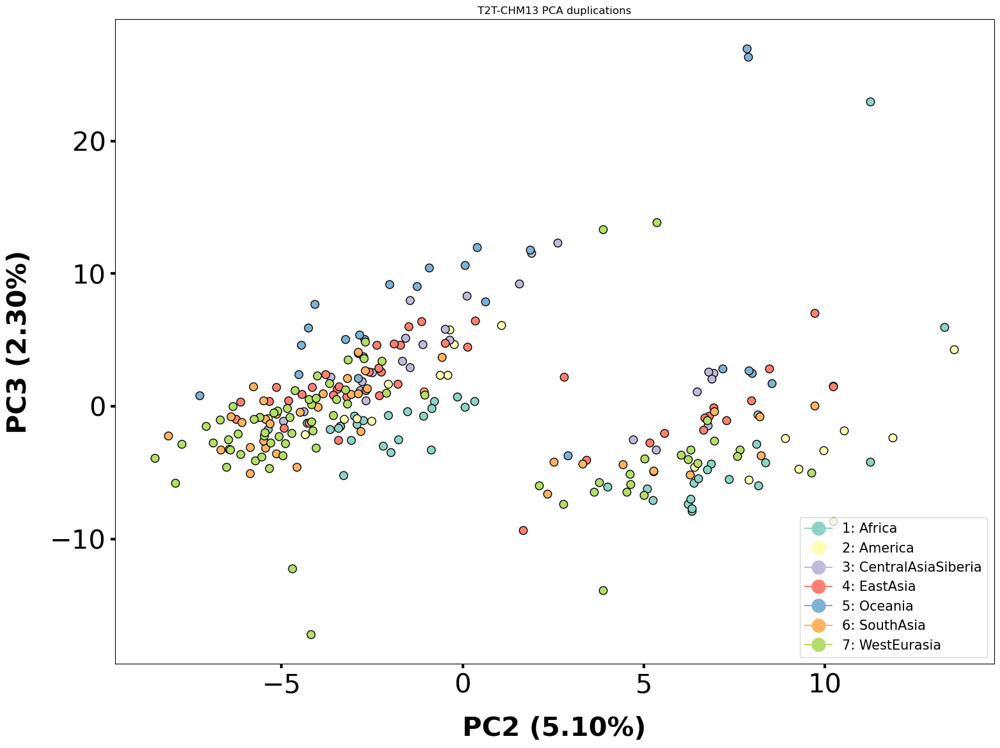

In [75]:
plot_scatter_cluster(data=df_pca, abscissa='component_2', ordinate='component_3', label_horizontal='PC2 (5.10%)', label_vertical='PC3 (2.30%)', factor='Region', fonts=define_font_properties(), colors=define_color_properties(), legend=True)
plt.title("T2T-CHM13 PCA duplications")

plt.savefig('../plots/t2t_chm13_pca_duplications_pc23_cnvr.png', transparent=True)

             component_1  component_2  component_3  component_4  component_5  \
Region                                                                         
Oceania        -1.056656     8.520344     1.760407     1.233268    -2.464798   
America       -10.193391    -0.414007     2.372123    -6.112513     7.443216   
WestEurasia    -3.970056     2.780878    -7.336102    -2.345541    -1.055970   
WestEurasia    -8.175982    -6.470137    -2.519105    -0.834249     1.030645   
Africa          3.526200     8.107496    -2.853954     8.729495     3.089414   
...                  ...          ...          ...          ...          ...   
WestEurasia     9.947591     3.876513    13.326808     3.847475    -6.892111   
Africa         -5.447319    11.251318    22.960158    15.166378     1.516990   
Oceania        -4.272133     7.874774    26.349856     7.642442    -3.176473   
Oceania        -4.008767     7.847227    26.965097     7.530920    -4.274634   
Africa          1.232514    13.285908   

             component_1  component_2  component_3  component_4  component_5  \
Region                                                                         
Oceania        -1.056656     8.520344     1.760407     1.233268    -2.464798   
America       -10.193391    -0.414007     2.372123    -6.112513     7.443216   
WestEurasia    -3.970056     2.780878    -7.336102    -2.345541    -1.055970   
WestEurasia    -8.175982    -6.470137    -2.519105    -0.834249     1.030645   
Africa          3.526200     8.107496    -2.853954     8.729495     3.089414   
...                  ...          ...          ...          ...          ...   
WestEurasia     9.947591     3.876513    13.326808     3.847475    -6.892111   
Africa         -5.447319    11.251318    22.960158    15.166378     1.516990   
Oceania        -4.272133     7.874774    26.349856     7.642442    -3.176473   
Oceania        -4.008767     7.847227    26.965097     7.530920    -4.274634   
Africa          1.232514    13.285908   

/Users/luciabazan/Documents/GitHub/cnv_sgdp/scripts/pca_plot.py:50: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  figure = matplotlib.pyplot.figure(


             component_1  component_2  component_3  component_4  component_5  \
Region                                                                         
Oceania        -1.056656     8.520344     1.760407     1.233268    -2.464798   
America       -10.193391    -0.414007     2.372123    -6.112513     7.443216   
WestEurasia    -3.970056     2.780878    -7.336102    -2.345541    -1.055970   
WestEurasia    -8.175982    -6.470137    -2.519105    -0.834249     1.030645   
Africa          3.526200     8.107496    -2.853954     8.729495     3.089414   
...                  ...          ...          ...          ...          ...   
WestEurasia     9.947591     3.876513    13.326808     3.847475    -6.892111   
Africa         -5.447319    11.251318    22.960158    15.166378     1.516990   
Oceania        -4.272133     7.874774    26.349856     7.642442    -3.176473   
Oceania        -4.008767     7.847227    26.965097     7.530920    -4.274634   
Africa          1.232514    13.285908   

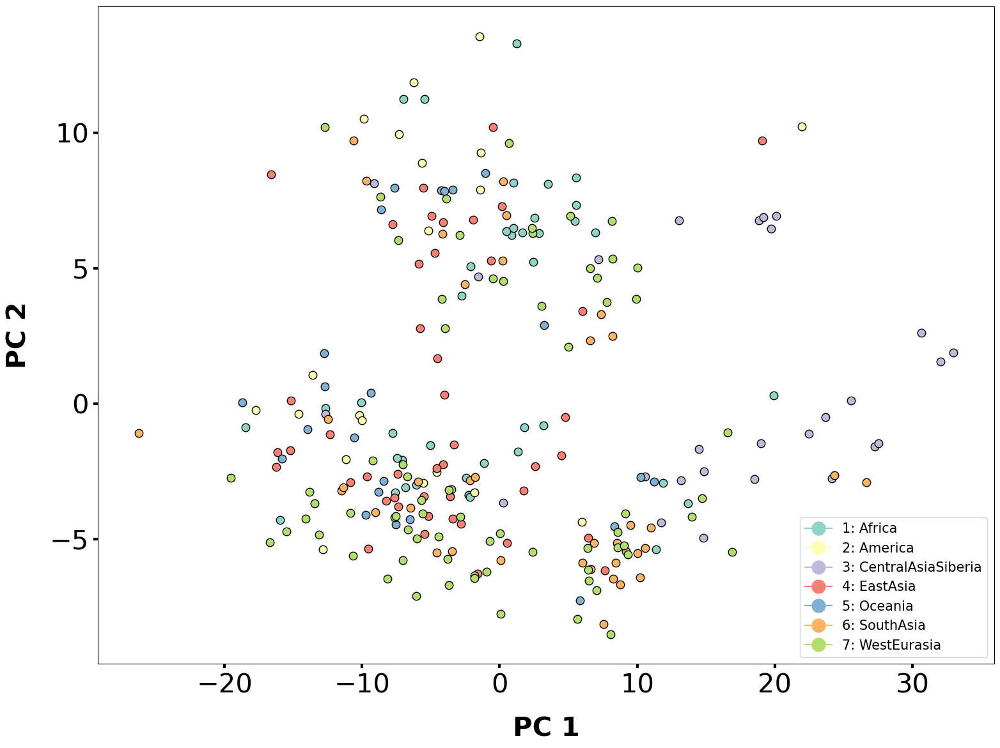

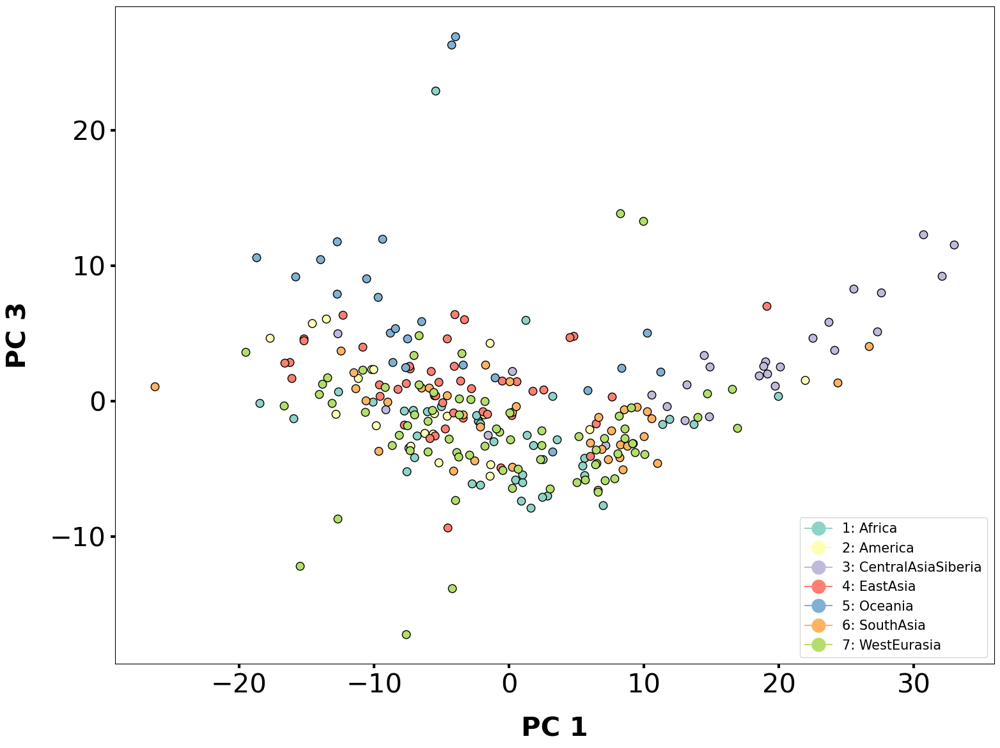

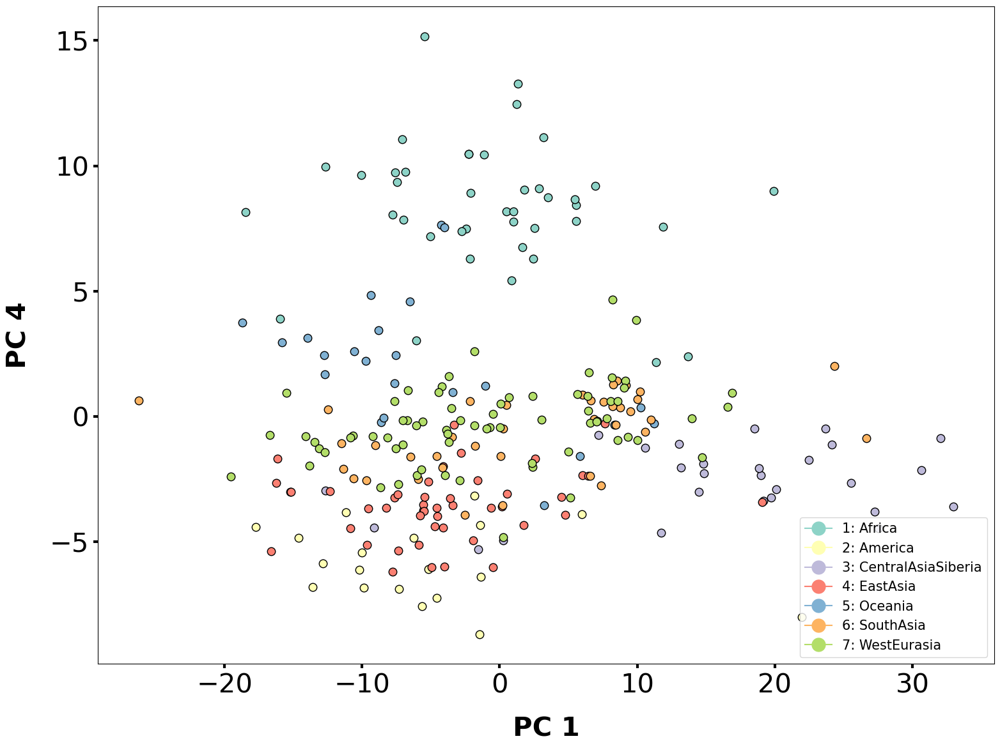

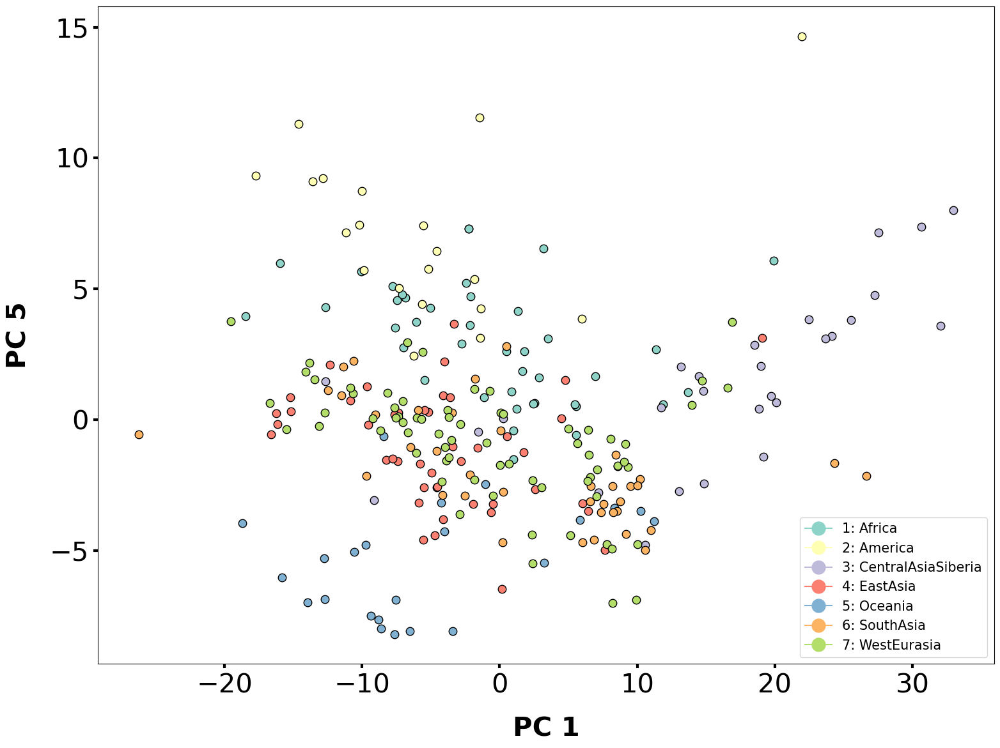

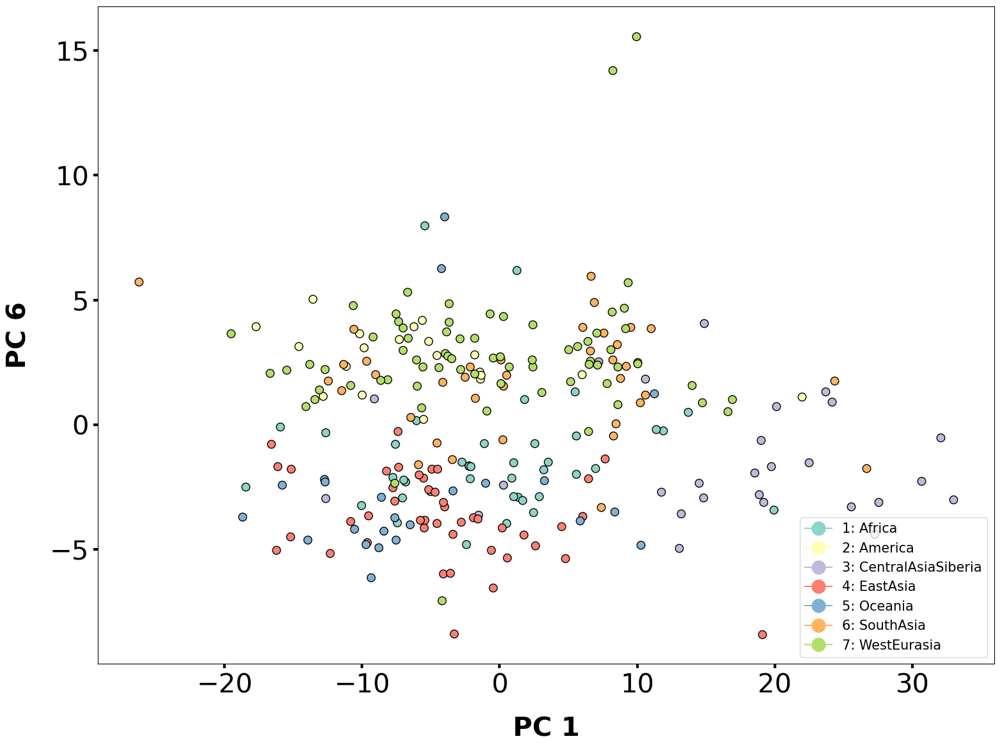

...

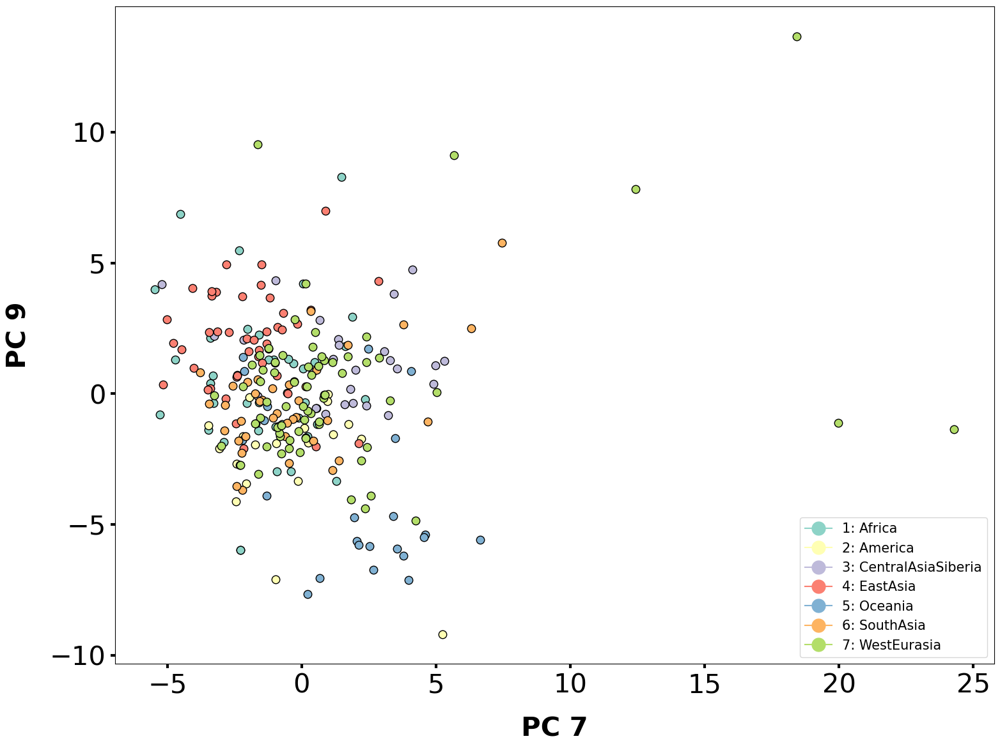

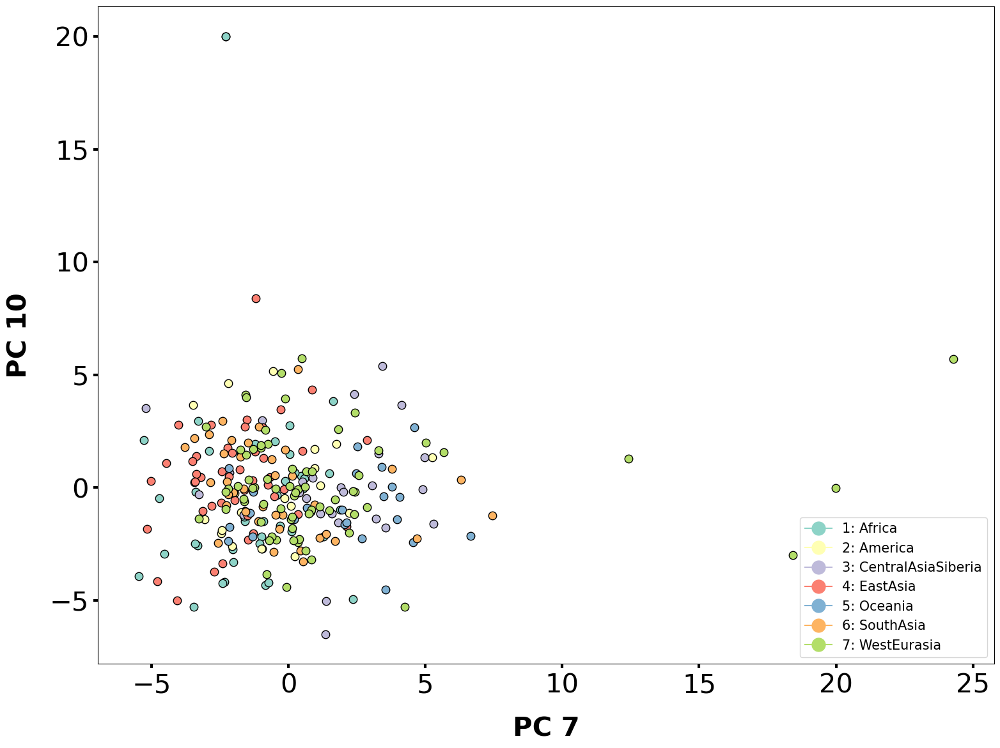

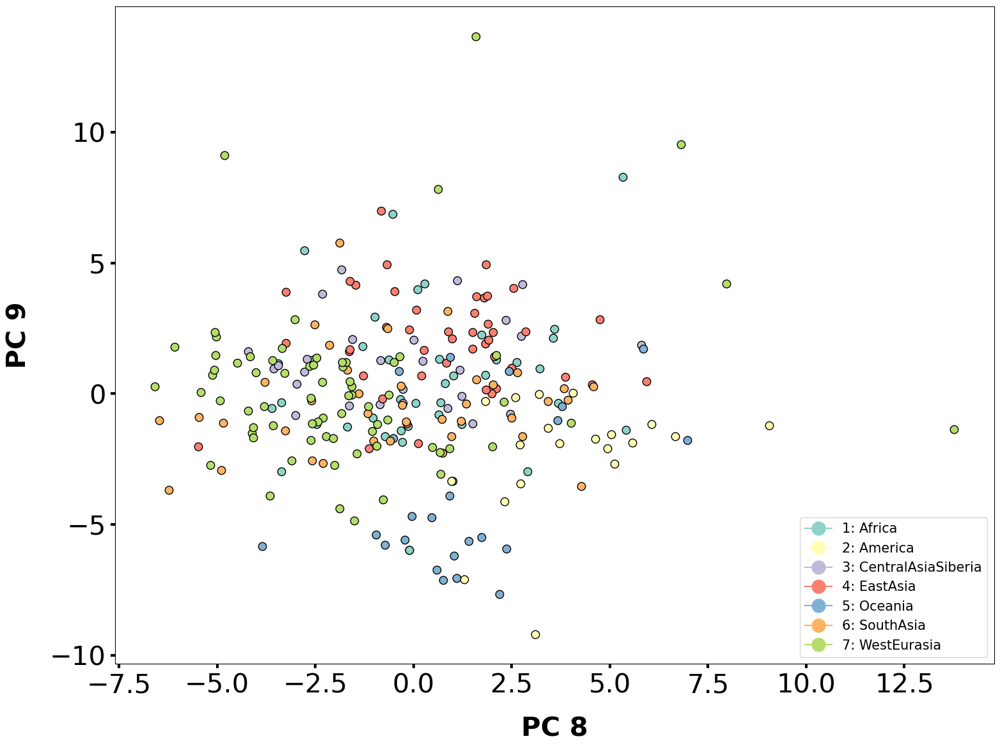

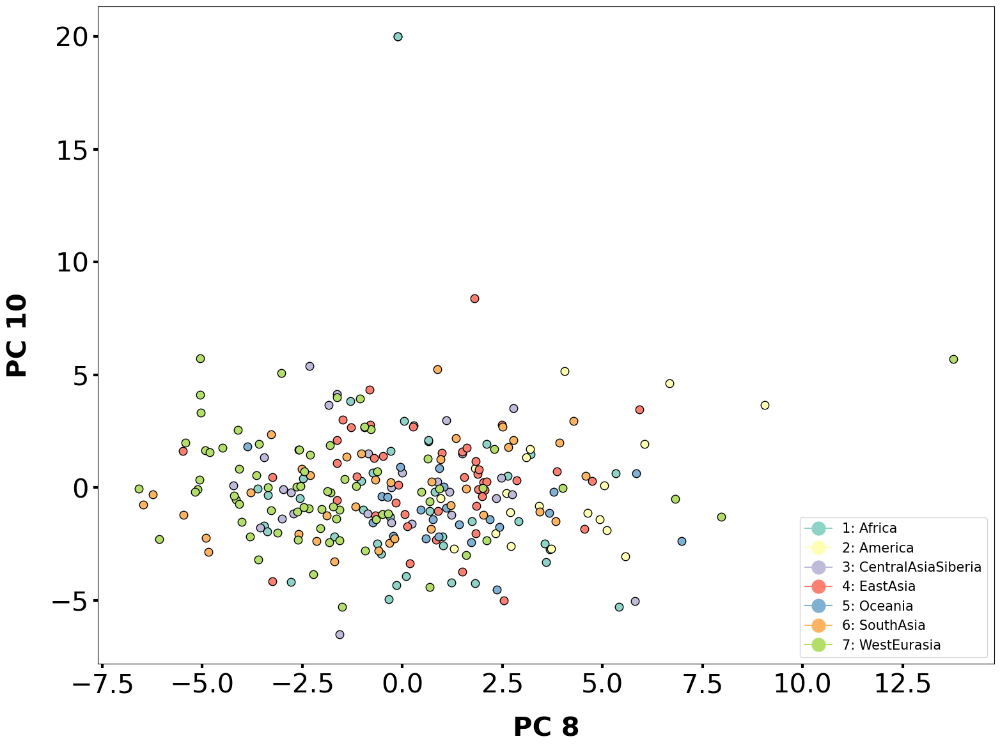

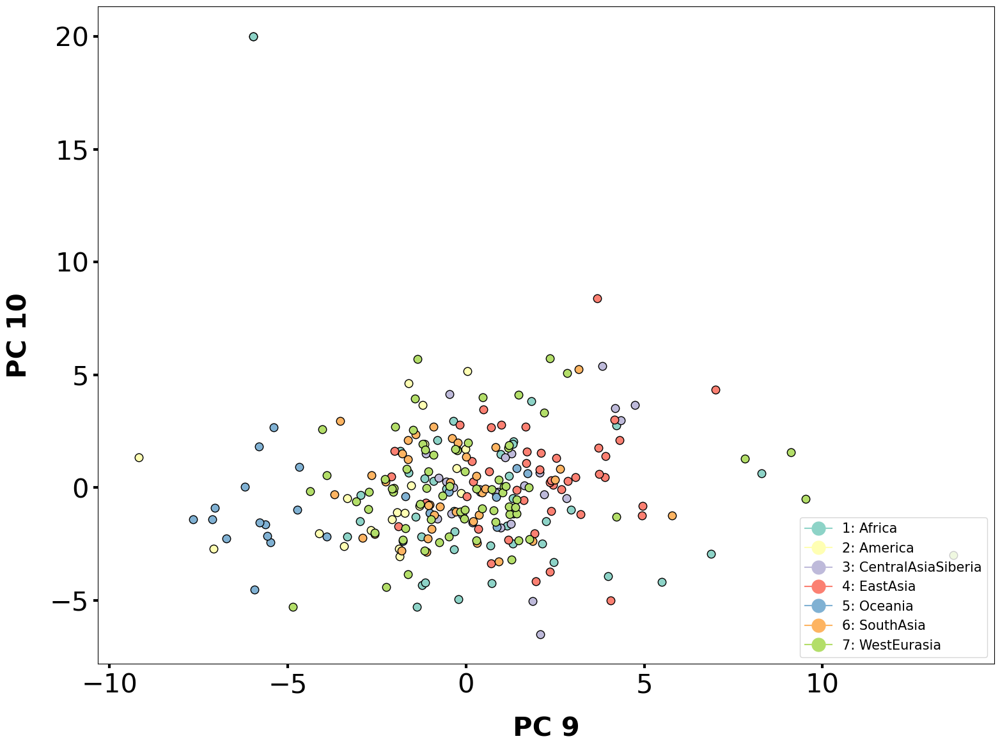

In [76]:
components = [1,2,3,4,5,6,7,8,9,10]

combinations_components = list(combinations(components,2))
for i in combinations_components:
    plot_scatter_cluster(data=df_pca, abscissa='component_'+str(i[0]), ordinate='component_'+str(i[1]), label_horizontal='PC '+ str(i[0]), label_vertical='PC '+str(i[1]), factor='Region', fonts=define_font_properties(), colors=define_color_properties(), legend=True)
    #print(str(i[0]))

In [77]:
vst_dt_filtered_duplications = vst_dt.iloc[cnv_passed_vst.index]
vst_dt_filtered_duplications.sort_values(by=['Oceania-WestEurasia'], ascending=False).head(50)

,Chromosome,Start,End,Africa-America,Africa-CentralAsiaSiberia,Africa-EastAsia,Africa-Oceania,Africa-SouthAsia,Africa-WestEurasia,America-CentralAsiaSiberia,...,CentralAsiaSiberia-Oceania,CentralAsiaSiberia-SouthAsia,CentralAsiaSiberia-WestEurasia,EastAsia-Oceania,EastAsia-SouthAsia,EastAsia-WestEurasia,Oceania-SouthAsia,Oceania-WestEurasia,SouthAsia-WestEurasia,i
108649,chr8,144763086,144782295,0.00597,0.08607,0.11986,0.29754,0.00822,0.01630,0.04321,...,0.07582,0.04211,0.15483,0.03913,0.07079,0.20527,0.21660,0.38324,0.04425,108649.0
120157,chr10,83240324,83243664,0.13277,0.40516,0.16208,0.00531,0.26846,0.46327,0.10610,...,0.36790,0.04819,0.00000,0.09985,0.02080,0.13354,0.20037,0.37331,0.05329,120157.0
160222,chr16,64694368,64715794,0.07163,0.08546,0.00002,0.16450,0.01548,0.06398,0.00000,...,0.39049,0.03040,0.01201,0.16052,0.01642,0.06598,0.24364,0.37248,0.01149,160222.0
164598,chr17,10892408,10905466,0.00110,0.05579,0.04690,0.09625,0.00056,0.18659,0.03886,...,0.00812,0.04673,0.32743,0.00642,0.03875,0.25943,0.08559,0.36245,0.20581,164598.0
138147,chr13,22203778,22229397,0.02996,0.07856,0.00294,0.14258,0.01981,0.11807,0.01399,...,0.39648,0.02900,0.00537,0.12052,0.04103,0.16052,0.27744,0.34588,0.05528,138147.0
43550,chr3,143570876,143587732,0.15977,0.01060,0.19671,0.47335,0.01422,0.01066,0.10066,...,0.41144,0.00013,0.00001,0.14718,0.11689,0.12643,0.39283,0.34468,0.00023,43550.0
13147,chr1,233563506,233570810,0.32404,0.52045,0.86890,0.66712,0.24839,0.04955,0.01645,...,0.04948,0.06593,0.22898,0.00964,0.32794,0.53320,0.17582,0.34372,0.07442,13147.0
58329,chr4,181936688,181943703,0.08443,0.00173,0.03317,0.18388,0.01324,0.03647,0.08818,...,0.22571,0.00536,0.02030,0.35273,0.00468,0.00006,0.28887,0.34327,0.00555,58329.0
55858,chr4,109306446,109349208,0.14723,0.03220,0.06116,0.19548,0.02269,0.01072,0.06137,...,0.09689,0.00056,0.10268,0.03243,0.01237,0.13921,0.09617,0.34304,0.07760,55858.0
7286,chr1,88471728,88473184,0.06032,0.06059,0.00049,0.31617,0.01291,0.00156,0.00101,...,0.39340,0.08180,0.02296,0.30477,0.00898,0.00347,0.21930,0.31124,0.01922,7286.0


<h1> Permutation

In [ ]:
print("Starting permutation")
### Grouping again 
cnvs_passed_vst = cnvs.T.iloc[filtering_vst.T.index]
cnvs_passed_vst = cnvs_passed_vst.T

dt_cnvs_passed_vst = features.merge(cnvs_passed_vst, left_index=True, right_index=True)
dt_cnvs_passed_vst.head()


In [ ]:
cnvs_passed_vst.columns

In [ ]:
####### Groupby regions #######
dt_group = dt_cnvs_passed_vst.groupby('Region')

dt_groupped = []
regions = features['Region'].unique()
for i in regions:
    dt_groupped.append(dt_group.get_group(str(i)))
    

#### Names to pair-population
regions = dt['Region'].unique()
combination_names = []
for i in list(combinations(regions,2)):
    combination_names.append(i[0]+str('-')+i[1])
    
dt_groupped[region[0]]

In [ ]:
p_value_permutation = []

combination_regions = list(combinations([0,1,2,3,4,5,6],2)) 
for region in combination_regions:
    p_value= []
    p_value_permutation.append(p_value)
    
    for i in cnvs_passed_vst.columns:
        permutation = PermutationTest(dt_groupped[region[0]][i], dt_groupped[region[1]][i], stat=vst_function, n_perm=9999)#mean_gt
        p_value.append(permutation.p_value())

In [ ]:
pd.DataFrame(p_value_permutation)

In [ ]:
permutation_pased__vst_chm13 = pd.DataFrame(p_value_permutation).set_axis(combination_names)
# create a process pool that uses all cpus
permutation_pased__vst_chm13.to_csv('../data/permutation_passed_vst_chm13.csv')
permutation_pased__vst_chm13

In [ ]:
permutation_pased__vst_chm13  = pd.read_csv('../data/permutation_passed_vst_chm13.csv', index_col=0)
permutation_pased__vst_chm13 = permutation_pased__vst_chm13.fillna(0)

<h1> Just vst values that passed permutation

In [ ]:
vst_dt_filtered = vst_dt.iloc[filtering_vst.T.index]
vst_dt_filtered = vst_dt_filtered.reset_index()
vst_dt_sb = vst_dt_filtered.drop(columns=['chr', 'start','end', 'index'])
vst_dt_sb.describe()

In [ ]:
passed_permut = (permutation_pased__vst_chm13 <0.05)
## Deleting columns where none of the regions passed the imputation
passed_permut =  passed_permut.loc[:, passed_permut.any()]


passed_permut = passed_permut.T
passed_permut = passed_permut.replace(False, np.NaN)
passed_permut = passed_permut.reset_index()
passed_permut = passed_permut.drop(columns=['index'])
passed_permut#.describe()

In [ ]:
passed_permut[passed_permut.notnull()] = vst_dt_sb

In [ ]:
passed_permut

In [ ]:
#sns.set_palette("bright")
for i in passed_permut.columns:
    plt.hist(passed_permut[i], bins=100, alpha=0.2,log=True, color="blue")
    plt.title('T2T-CHM13')

In [ ]:
final_candidates  = pd.DataFrame(passed_permut.T)>=0.2
final_candidates = final_candidates.loc[:, final_candidates.any()]
final_candidates